In [1]:
import vaex
import numpy as np
import pandas as pd
from glob import glob
from matplotlib import pyplot as plt
from scipy.stats import norm, poisson
from scipy.optimize import curve_fit
from os.path import join, abspath
import sys
from os import pardir, mkdir
from tqdm import tqdm
from hammer import dm

In [2]:
root_dir = abspath(pardir)
root_dir

'/home2/s20321005/Thesis-Project'

In [3]:
if root_dir not in sys.path:
    sys.path.append(root_dir)
sys.path

['/home2/s20321005/Thesis-Project/3_Vertical_Velocity',
 '/home2/s20321005/.conda/envs/vaex/lib/python38.zip',
 '/home2/s20321005/.conda/envs/vaex/lib/python3.8',
 '/home2/s20321005/.conda/envs/vaex/lib/python3.8/lib-dynload',
 '',
 '/home2/s20321005/.local/lib/python3.8/site-packages',
 '/home2/s20321005/.conda/envs/vaex/lib/python3.8/site-packages',
 '/home2/s20321005/Thesis-Project']

In [4]:
from utils import safe_mkdir, style

In [5]:
style()

In [6]:
root_data_dir = abspath(join(root_dir, "Data"))
root_data_dir

'/home2/s20321005/Thesis-Project/Data'

In [7]:
spectral_dir = join(root_data_dir, "Spectral-Class-Cluster-no")
spectral_dir

'/home2/s20321005/Thesis-Project/Data/Spectral-Class-Cluster-no'

In [8]:
name = "Velocity-Distribution-no"
data_dir = join(root_data_dir, name)
safe_mkdir(data_dir)

Directory /home2/s20321005/Thesis-Project/Data/Velocity-Distribution-no already exist. Good to go!


In [9]:
files = glob(join(spectral_dir, "*.hdf5"))
files.sort()
files

['/home2/s20321005/Thesis-Project/Data/Spectral-Class-Cluster-no/gaia_(-0.10)_(0.11).hdf5',
 '/home2/s20321005/Thesis-Project/Data/Spectral-Class-Cluster-no/gaia_(0.11)_(0.16).hdf5',
 '/home2/s20321005/Thesis-Project/Data/Spectral-Class-Cluster-no/gaia_(0.16)_(0.20).hdf5',
 '/home2/s20321005/Thesis-Project/Data/Spectral-Class-Cluster-no/gaia_(0.20)_(0.24).hdf5',
 '/home2/s20321005/Thesis-Project/Data/Spectral-Class-Cluster-no/gaia_(0.24)_(0.27).hdf5',
 '/home2/s20321005/Thesis-Project/Data/Spectral-Class-Cluster-no/gaia_(0.27)_(0.29).hdf5',
 '/home2/s20321005/Thesis-Project/Data/Spectral-Class-Cluster-no/gaia_(0.29)_(0.31).hdf5',
 '/home2/s20321005/Thesis-Project/Data/Spectral-Class-Cluster-no/gaia_(0.31)_(0.33).hdf5',
 '/home2/s20321005/Thesis-Project/Data/Spectral-Class-Cluster-no/gaia_(0.33)_(0.35).hdf5',
 '/home2/s20321005/Thesis-Project/Data/Spectral-Class-Cluster-no/gaia_(0.35)_(0.37).hdf5',
 '/home2/s20321005/Thesis-Project/Data/Spectral-Class-Cluster-no/gaia_(0.37)_(0.38).hdf5'

In [10]:
index = 0
gaia_raw = vaex.open(files[index])
gaia_raw

#,ra,dec,Jmag,Kmag,ph_qual,source_id,pm,pmra,e_pmra,pmdec,e_pmdec,parallax,e_parallax,gmag,bpmag,rpmag,fb_over_err,fr_over_err,ruwe,excess_factor,GLON,GLAT,distance_gspphot,distance_gspphot_lower,distance_gspphot_upper,ag_gspphot,ag_gspphot_lower,ag_gspphot_upper,fem_gspspec,fem_gspspec_lower,fem_gspspec_upper,spectraltype_esphs,subclass_lamost,rv,rv_cat,rv_el,rv_eu,rv_sym,teff,teff_cat,teff_el,teff_eu,teff_sym,logg,logg_cat,logg_el,logg_eu,logg_sym,feh,feh_cat,feh_el,feh_eu,feh_sym,mh,mh_cat,mh_el,mh_eu,mh_sym,alphafe,alphafe_cat,alphafe_el,alphafe_eu,alphafe_sym,alpham,alpham_cat,alpham_el,alpham_eu,alpham_sym,JK,M_J,Dist,z,r,pmlon,pmlat,e_pmlon,e_pmlat,vb,vphi,e_vb,e_vphi,w,e_rv,e_w,v_xy,e_v_xy,v,e_v,u,e_u,M_J_lower,M_J_upper
0,0.014884639099905679,-0.6277107372592441,8.755000114440918,8.656999588012695,AAA,2309518882743792512,23.22193717956543,22.29106181287425,0.015476686879992485,6.508986172951364,0.016319049522280693,4.789413549620276,0.020170677453279495,9.131726264953613,9.230249404907227,8.934432983398438,1889.544189453125,2443.355224609375,1.1517304182052612,1.167120337486267,2.951179464847555,-1.3351842543237686,208.5220947265625,204.33360290527344,210.59359741210938,0.003100000089034438,0.0010000000474974513,0.00570000009611249,nan,nan,nan,A,--,13.979635238647461,gaia,0.8730981349945068,0.8730981349945068,1.0,7851.72216796875,gspphot,7.68994140625,6.4814453125,0.0,4.14709997177124,gspphot,0.008999824523925781,0.014599800109863281,0.0,nan,--,nan,nan,nan,-1.2071000337600708,gspphot,0.004799962043762207,0.006800055503845215,0.0,0.12999999523162842,rave,nan,nan,-1.0,nan,--,nan,nan,nan,0.09800052642822266,2.1564118070290146,208.79383031755194,-203.02519970723176,48.7404540655227,-8.415224816113692,-21.64352857182297,0.016011703235616633,0.015794447555597668,-21.420227000145907,-8.328402885890153,-0.09155582963669412,-0.038488697266941825,-18.593699921256633,0.8730981349945068,0.8492448485468144,-17.56504054597298,0.22240955574805651,15.671299950086627,0.21851120838760413,11.50231723983446,0.056570682463120345,0.656183260425856,2.2724350893667364
1,0.01692606345950085,0.3891393605162341,7.978000164031982,7.916999816894531,AAA,2847236045035991808,7.534960746765137,0.31428973130157245,0.028740057721734047,-7.528403412132262,0.035291653126478195,5.414626649593402,0.03218960762023926,8.257993698120117,8.308849334716797,8.131924629211426,1606.518310546875,3663.614990234375,1.0435644388198853,1.1647926568984985,-1.2447639901461083,-0.6851463533673376,185.764404296875,183.57119750976562,187.21949768066406,0.40720000863075256,0.4049000144004822,0.41269999742507935,nan,nan,nan,A,--,-1.9623053073883057,gaia,0.8112114071846008,0.8112114071846008,1.0,10111.888671875,gspphot,14.7001953125,61.91796875,0.0,4.351399898529053,gspphot,0.004600048065185547,0.0062999725341796875,0.0,nan,--,nan,nan,nan,0.04969999939203262,gspphot,0.06459999922662973,0.016599997878074646,0.0,nan,--,nan,nan,nan,nan,--,nan,nan,nan,0.06100034713745117,1.6458427462058371,184.68494038736586,-116.86610814118873,143.00643333017175,-1.4773945887055326,-7.388703621087389,0.02914644273095347,0.03495678152203822,-6.468120044174079,-1.2933209995171295,-0.049143105132327135,-0.026648281766649008,-3.766716399021818,0.8112114071846008,0.5147320000869019,-5.61240292518195,0.6289117267272132,-0.5723895823176695,0.20300791047069605,-5.730978622228241,0.5958421596550898,0.5031712031916151,2.133604850608599
2,0.0035158959649724967,0.5305083072141416,8.081000328063965,8.039999961853027,AAA,2873312200239661568,14.617414474487305,14.451251005288686,0.030547887086868286,-2.1977605786351746,0.020109251141548157,5.780108878698743,0.030021460726857185,8.32446002960205,8.370553970336914,8.213418960571289,1918.97314453125,3164.412841796875,1.0105706453323364,1.161336064338684,-1.2188784047472103,-0.5448464699442576,174.9145965576172,173.51480102539062,177.49130249023438,0.21850000321865082,0.21230000257492065,0.22370000183582306,nan,nan,nan,A,--,2.5488598346710205,gaia,0.590409755706787

check out high error data

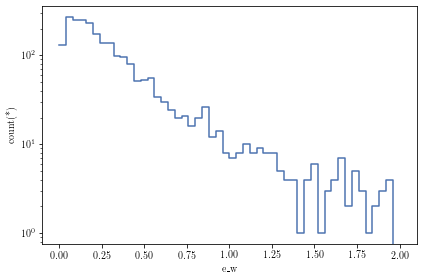

In [11]:
gaia_raw.viz.histogram("e_w", limits=[0, 2], shape=50)
plt.yscale("log")

In [12]:
gaia = gaia_raw
gaia

#,ra,dec,Jmag,Kmag,ph_qual,source_id,pm,pmra,e_pmra,pmdec,e_pmdec,parallax,e_parallax,gmag,bpmag,rpmag,fb_over_err,fr_over_err,ruwe,excess_factor,GLON,GLAT,distance_gspphot,distance_gspphot_lower,distance_gspphot_upper,ag_gspphot,ag_gspphot_lower,ag_gspphot_upper,fem_gspspec,fem_gspspec_lower,fem_gspspec_upper,spectraltype_esphs,subclass_lamost,rv,rv_cat,rv_el,rv_eu,rv_sym,teff,teff_cat,teff_el,teff_eu,teff_sym,logg,logg_cat,logg_el,logg_eu,logg_sym,feh,feh_cat,feh_el,feh_eu,feh_sym,mh,mh_cat,mh_el,mh_eu,mh_sym,alphafe,alphafe_cat,alphafe_el,alphafe_eu,alphafe_sym,alpham,alpham_cat,alpham_el,alpham_eu,alpham_sym,JK,M_J,Dist,z,r,pmlon,pmlat,e_pmlon,e_pmlat,vb,vphi,e_vb,e_vphi,w,e_rv,e_w,v_xy,e_v_xy,v,e_v,u,e_u,M_J_lower,M_J_upper
0,0.014884639099905679,-0.6277107372592441,8.755000114440918,8.656999588012695,AAA,2309518882743792512,23.22193717956543,22.29106181287425,0.015476686879992485,6.508986172951364,0.016319049522280693,4.789413549620276,0.020170677453279495,9.131726264953613,9.230249404907227,8.934432983398438,1889.544189453125,2443.355224609375,1.1517304182052612,1.167120337486267,2.951179464847555,-1.3351842543237686,208.5220947265625,204.33360290527344,210.59359741210938,0.003100000089034438,0.0010000000474974513,0.00570000009611249,nan,nan,nan,A,--,13.979635238647461,gaia,0.8730981349945068,0.8730981349945068,1.0,7851.72216796875,gspphot,7.68994140625,6.4814453125,0.0,4.14709997177124,gspphot,0.008999824523925781,0.014599800109863281,0.0,nan,--,nan,nan,nan,-1.2071000337600708,gspphot,0.004799962043762207,0.006800055503845215,0.0,0.12999999523162842,rave,nan,nan,-1.0,nan,--,nan,nan,nan,0.09800052642822266,2.1564118070290146,208.79383031755194,-203.02519970723176,48.7404540655227,-8.415224816113692,-21.64352857182297,0.016011703235616633,0.015794447555597668,-21.420227000145907,-8.328402885890153,-0.09155582963669412,-0.038488697266941825,-18.593699921256633,0.8730981349945068,0.8492448485468144,-17.56504054597298,0.22240955574805651,15.671299950086627,0.21851120838760413,11.50231723983446,0.056570682463120345,0.656183260425856,2.2724350893667364
1,0.01692606345950085,0.3891393605162341,7.978000164031982,7.916999816894531,AAA,2847236045035991808,7.534960746765137,0.31428973130157245,0.028740057721734047,-7.528403412132262,0.035291653126478195,5.414626649593402,0.03218960762023926,8.257993698120117,8.308849334716797,8.131924629211426,1606.518310546875,3663.614990234375,1.0435644388198853,1.1647926568984985,-1.2447639901461083,-0.6851463533673376,185.764404296875,183.57119750976562,187.21949768066406,0.40720000863075256,0.4049000144004822,0.41269999742507935,nan,nan,nan,A,--,-1.9623053073883057,gaia,0.8112114071846008,0.8112114071846008,1.0,10111.888671875,gspphot,14.7001953125,61.91796875,0.0,4.351399898529053,gspphot,0.004600048065185547,0.0062999725341796875,0.0,nan,--,nan,nan,nan,0.04969999939203262,gspphot,0.06459999922662973,0.016599997878074646,0.0,nan,--,nan,nan,nan,nan,--,nan,nan,nan,0.06100034713745117,1.6458427462058371,184.68494038736586,-116.86610814118873,143.00643333017175,-1.4773945887055326,-7.388703621087389,0.02914644273095347,0.03495678152203822,-6.468120044174079,-1.2933209995171295,-0.049143105132327135,-0.026648281766649008,-3.766716399021818,0.8112114071846008,0.5147320000869019,-5.61240292518195,0.6289117267272132,-0.5723895823176695,0.20300791047069605,-5.730978622228241,0.5958421596550898,0.5031712031916151,2.133604850608599
2,0.0035158959649724967,0.5305083072141416,8.081000328063965,8.039999961853027,AAA,2873312200239661568,14.617414474487305,14.451251005288686,0.030547887086868286,-2.1977605786351746,0.020109251141548157,5.780108878698743,0.030021460726857185,8.32446002960205,8.370553970336914,8.213418960571289,1918.97314453125,3164.412841796875,1.0105706453323364,1.161336064338684,-1.2188784047472103,-0.5448464699442576,174.9145965576172,173.51480102539062,177.49130249023438,0.21850000321865082,0.21230000257492065,0.22370000183582306,nan,nan,nan,A,--,2.5488598346710205,gaia,0.590409755706787

In [18]:
zs = gaia['z'].to_numpy()
ws = gaia['w'].to_numpy()
ews = gaia['e_w'].to_numpy()
mask = ~np.isnan(ws) & ~np.isnan(ews) & (np.abs(zs) < 50)
ws = ws[mask]
ews = ews[mask]

med = np.median(ws)
mad = np.median(np.abs(ws-med))
BIN = 20
wedge = np.linspace(med-mad*6, med+mad*6, BIN+1)
wedge

array([-29.63489298, -27.32123584, -25.0075787 , -22.69392155,
       -20.38026441, -18.06660727, -15.75295012, -13.43929298,
       -11.12563584,  -8.8119787 ,  -6.49832155,  -4.18466441,
        -1.87100727,   0.44264988,   2.75630702,   5.06996416,
         7.38362131,   9.69727845,  12.01093559,  14.32459274,
        16.63824988])

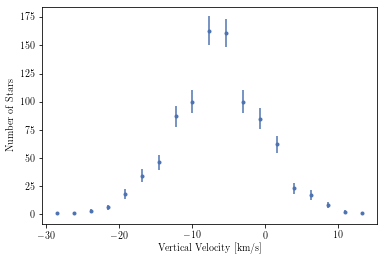

In [26]:
wmid = (wedge[1:] + wedge[:-1]) / 2
wnum, _ = np.histogram(ws, wedge)
mask = wnum > 0
wnum = wnum[mask]
wmid = wmid[mask]
werr = np.sqrt(wnum)
max = np.max(wnum)
# wnum, werr = wnum/max, werr/max
plt.errorbar(wmid, wnum, yerr=werr, fmt='.')
plt.xlabel("Vertical Velocity [km/s]")
plt.ylabel("Number of Stars")
plt.show()

In [27]:
M = 100_000
log_w = np.empty(M, dtype=float)
ns_est = np.empty((M, len(wmid)), dtype=int)
for i in tqdm(range(M)):
    x_realization = np.random.normal(loc=ws, scale=ews, size=len(ws))
    ns_est_i = np.histogram(x_realization, bins=wedge)[0]
    ns_est[i] = ns_est_i[mask]

100%|██████████| 100000/100000 [00:15<00:00, 6632.69it/s]


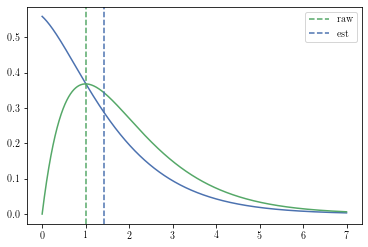

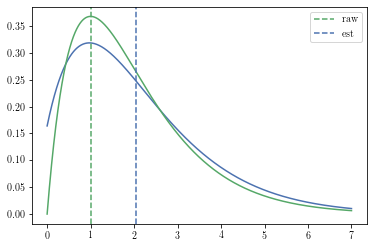

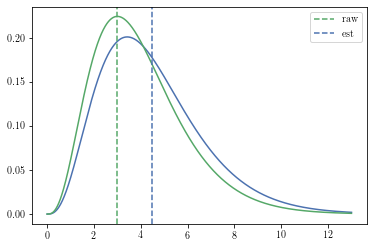

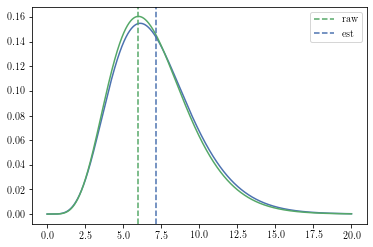

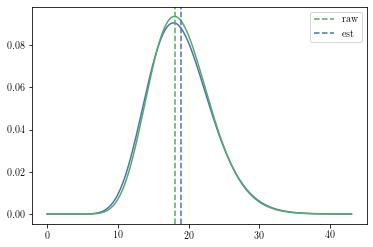

...

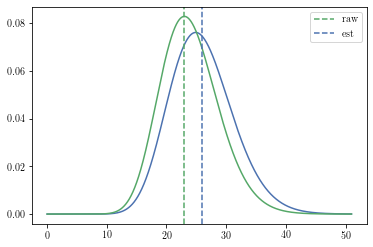

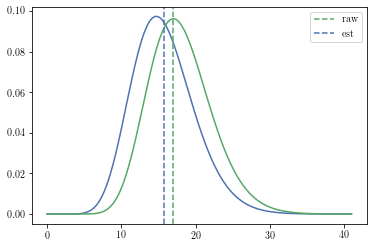

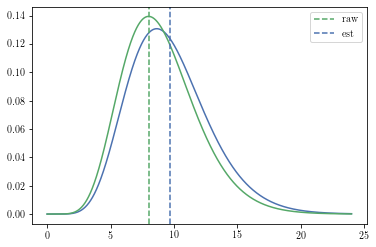

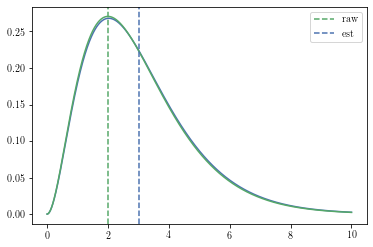

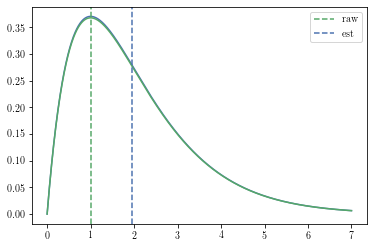

In [30]:
w_est = np.empty_like(wnum)
w_err = np.empty_like(wnum)
for i in range(len(wmid)):
    nw_min = np.floor(ns_est[:, i].min())
    nw_max = np.ceil(ns_est[:, i].max())
    bins = np.arange(nw_min-1/2, nw_max+1/2)
    w, n_edge = np.histogram(ns_est[:, i], bins=bins, density=True)
    ns = (n_edge[1:] + n_edge[:-1]) / 2
    mask = w > 0
    w = w[mask]
    ns = ns[mask]
    m = 6
    lambdas = np.linspace(np.maximum(0, np.floor(wnum[i]-m*werr[i])), np.floor(wnum[i]+m*werr[i]), 10_000)
    dlambda = lambdas[1] - lambdas[0]
    pn = np.sum(w[:, None]*poisson.pmf(ns[:,None], lambdas[None, :]), axis=0)
    area = np.trapz(pn, lambdas)
    pn = pn / area
    mu = np.sum(pn * lambdas)*dlambda
    wi_est = mu
    w_est[i] = wi_est
    Elambda2 = np.sum(pn * lambdas**2)*dlambda
    sigma2 = Elambda2 - mu**2
    wi_err = np.sqrt(sigma2)
    w_err[i] = wi_err
    
    plt.plot(lambdas, pn, c='C0')
    plt.plot(lambdas, poisson.pmf(wnum[i], lambdas), 'C1')
    plt.axvline(wnum[i], c='C1', ls='--', label='raw')
    plt.axvline(wi_est, c='C0', ls='--', label="est")
    plt.legend()
    plt.show()
    # break

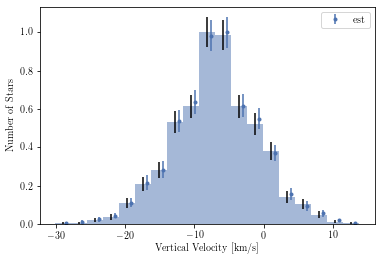

In [31]:
dw = np.min(np.diff(wedge))
plt.bar(wmid-0.5, wnum/wnum.max(), yerr=werr/wnum.max(), width=dw, alpha=0.5)
plt.errorbar(wmid, w_est/w_est.max(), yerr=w_err/w_est.max(), fmt='.', label="est")
plt.xlabel("Vertical Velocity [km/s]")
plt.ylabel("Number of Stars")
plt.legend()
# plt.yscale('log')
plt.show()

# MCMC

In [32]:
wnum, werr = w_est/w_est.max(), w_err/w_est.max()

In [33]:
from hammer import vel

# init
w0_init = {'low': -15, 'high': 0., 'value': -7., 'label': r'$w_0$', 'lab': 'w0'}
log_sigmaw_init = {'low': 0., 'high': 5., 'value': 2.4, 'label': r'$\log \sigma_w$', 'lab': 'log_sigmaw'}
q_sigmaw_init = {'low': 0., 'high': 1., 'value': 0.5, 'label': r'$q_{\sigma,w}$', 'lab': 'q_sigmaw'}
log_a_init = {'low': -1., 'high': 1., 'value': np.log(0.7), 'label': r'$\log a$', 'lab': 'log_a'}
q_a_init = {'low': 0., 'high': 1., 'value': 0.5, 'label': r'$q_a$', 'lab': 'q_a'}
log_phi_init = {'low': 0., 'high': 10., 'value': 2., 'label': r'$\log \Phi$', 'lab': 'log_phi'}

init = [w0_init, log_sigmaw_init, q_sigmaw_init, log_a_init, q_a_init, log_phi_init]

def generate_init(init):
    theta = []
    locs = []
    scales = []
    labels = []
    labs = []
    for i in range(len(init)):
        locs.append(init[i]['low'])
        scales.append(init[i]['high'] - init[i]['low'])
        theta.append(init[i]['value'])
        labels.append(init[i]['label'])
        labs.append(init[i]['lab'])
    return np.array(theta), np.array(locs), np.array(scales), np.array(labels), np.array(labs)

theta, locs, scales, labels, labs = generate_init(init)
[(lb, l, t, s) for lb,  l, t,s in zip(labels, locs, theta, scales)]

[('$w_0$', -15.0, -7.0, 15.0),
 ('$\\log \\sigma_w$', 0.0, 2.4, 5.0),
 ('$q_{\\sigma,w}$', 0.0, 0.5, 1.0),
 ('$\\log a$', -1.0, -0.35667494393873245, 2.0),
 ('$q_a$', 0.0, 0.5, 1.0),
 ('$\\log \\Phi$', 0.0, 2.0, 10.0)]

In [34]:
from scipy.stats import median_abs_deviation as mad

def get_initial_position_normal(labs, init, chain=None, indexes=None):
    locs = {i['lab']: i['low'] for i in init}
    scales = {i['lab']: i['high'] - i['low'] for i in init}
    if chain is not None:
        for k, i in zip(labs, indexes):
            v = chain[:, :, i]
            flat_raw = v.reshape(-1)
            mad_v = mad(flat_raw)
            median_v = np.median(flat_raw)                
            if k in ["q_sigmaw", "q_a"]:
                delta_up = (1-median_v)/5 if median_v+4*mad_v > 1. else mad_v
                delta_down = (median_v)/5 if median_v-4*mad_v < 0. else mad_v
                mid = (median_v+delta_up+median_v-delta_down)/2
                delta = (delta_up+delta_down)/2
                locs[k] = mid
                scales[k] = delta
                continue
            locs[k] = median_v
            scales[k] = mad_v
    keys = np.array(list(locs.keys()))
    locs = np.array(list(locs.values()))
    scales = np.array(list(scales.values()))
    return keys, locs, scales

In [35]:
wdata = (wmid, wnum, werr)
wdata

(array([-28.47806441, -26.16440727, -23.85075013, -21.53709298,
        -19.22343584, -16.9097787 , -14.59612155, -12.28246441,
         -9.96880727,  -7.65515012,  -5.34149298,  -3.02783584,
         -0.71417869,   1.59947845,   3.91313559,   6.22679274,
          8.54044988,  10.85410702,  13.16776416]),
 array([0.00617284, 0.01234568, 0.02469136, 0.04320988, 0.11111111,
        0.21604938, 0.28395062, 0.53703704, 0.63580247, 0.98148148,
        1.        , 0.61728395, 0.54938272, 0.37037037, 0.15432099,
        0.09259259, 0.05555556, 0.01851852, 0.00617284]),
 array([0.00617284, 0.00617284, 0.01234568, 0.01234568, 0.02469136,
        0.03703704, 0.04320988, 0.05555556, 0.0617284 , 0.08024691,
        0.08024691, 0.0617284 , 0.05555556, 0.04320988, 0.0308642 ,
        0.02469136, 0.01851852, 0.00617284, 0.00617284]))

In [36]:
ndim = 6
nwalker = 10*ndim
p0 = vel.generate_p0(nwalker, locs, scales)
p0.shape

(60, 6)

In [37]:
chain = vel.mcmc(2000, p0, wdata, locs, scales, parallel=True, verbose=True)
chain.shape

(2000, 60, 6)

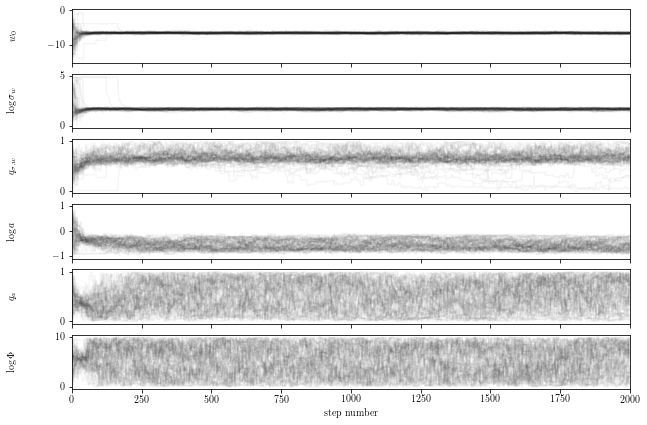

In [38]:
fig, axes = plt.subplots(ndim, figsize=(10, 7), sharex=True)
for i in range(ndim):
    ax = axes[i]
    ax.plot(chain[:, :, i], "k", alpha=0.04)
    ax.set_xlim(0, len(chain))
    ax.set_ylabel(labels[i])
    ax.yaxis.set_label_coords(-0.1, 0.5)
axes[-1].set_xlabel("step number");
plt.show()

In [39]:
indexes = list(range(ndim))
labs, locs_normal, scales_normal = get_initial_position_normal(labs, init, chain=chain[1000:], indexes=indexes)
p0 = vel.generate_p0(nwalker, locs_normal, scales_normal, norm=True)

In [40]:
chain = vel.mcmc(10000, p0, wdata, locs, scales, parallel=True, verbose=True)
chain.shape

(10000, 60, 6)

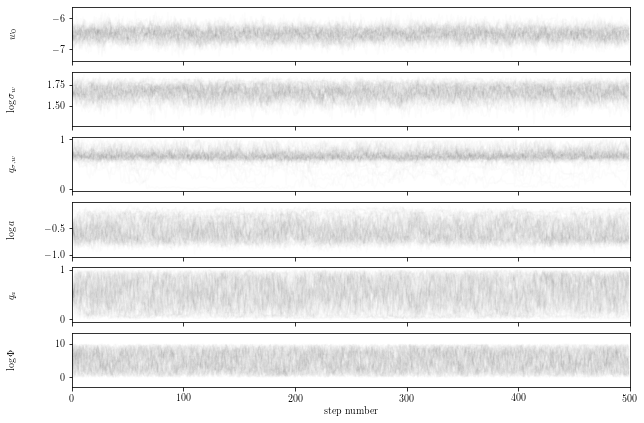

In [41]:
fig, axes = plt.subplots(ndim, figsize=(10, 7), sharex=True)
for i in range(ndim):
    ax = axes[i]
    ax.plot(chain[::20, :, i], "k", alpha=0.01)
    ax.set_xlim(0, len(chain[::20]))
    ax.set_ylabel(labels[i])
    ax.yaxis.set_label_coords(-0.1, 0.5)
axes[-1].set_xlabel("step number");

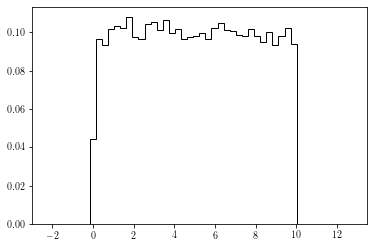

In [42]:
logphi = chain[::20, :, -1].reshape(-1)

plt.hist(logphi, bins=50, density=True, histtype='step', color='k');

In [43]:
# from scipy.optimize import curve_fit
# from scipy.stats import norm

# def mod_norm(x, A, mu, sigma, C):
#     return np.abs(A)*norm.pdf(x, mu, sigma) + np.abs(C)

# logphi_num, logphi_bins = np.histogram(logphi, bins=50)
# logphi_mid = (logphi_bins[1:] + logphi_bins[:-1])/2

# popt, pcov = curve_fit(mod_norm, logphi_mid, logphi_num, p0=[1, 2, 1, 0])

# plt.hist(logphi, bins=50, color='C0', edgecolor='k', alpha=0.5)
# plt.plot(logphi_mid, mod_norm(logphi_mid, *popt), 'r--')
# plt.plot(logphi_mid, popt[0]*norm.pdf(logphi_mid, loc=popt[1], scale=popt[2]), 'k--')
# plt.axvline(popt[1]+popt[2]*2.5, color='k', ls='--')
# plt.axvline(popt[1]-popt[2]*2.5, color='k', ls='--')
# plt.show()

In [25]:
# log_phi_init = {'low': popt[1]-popt[2]*2.5, 'high': popt[1]+popt[2]*2.5, 
#                 'value': popt[1], 'label': r'$\log \Phi$', 'lab': 'log_phi'}

# init = [w0_init, log_sigmaw_init, q_sigmaw_init, log_a_init, q_a_init, log_phi_init]
# theta, locs, scales, labels, labs = generate_init(init)
# [(lb, l, t, s) for lb,  l, t,s in zip(labels, locs, theta, scales)]

[('$w_0$', -15.0, -7.0, 15.0),
 ('$\\log \\sigma_w$', 0.0, 2.4, 5.0),
 ('$q_{\\sigma,w}$', 0.0, 0.5, 1.0),
 ('$\\log a$', -1.0, -0.35667494393873245, 2.0),
 ('$q_a$', 0.0, 0.5, 1.0),
 ('$\\log \\Phi$', 2.930929430165785, 5.1042792234316146, 4.34669958653166)]

In [44]:
# p0 = vel.generate_p0(nwalker, locs_normal, scales_normal, norm=True)
# chain = vel.mcmc(5000, p0, wdata, locs, scales, parallel=True, verbose=True)
for i in tqdm(range(5)):
    labs, locs_normal, scales_normal = get_initial_position_normal(labs, init, chain=chain[500:], indexes=indexes)
    p0 = vel.generate_p0(nwalker, locs_normal, scales_normal, norm=True)
    chain = vel.mcmc(10000, p0, wdata, locs, scales, parallel=True, verbose=True)
    p0_next = chain[-1]
    chain = vel.mcmc(10000, p0_next, wdata, locs, scales, parallel=True, verbose=True)
    chain = chain[::10]

100%|██████████| 5/5 [00:08<00:00,  1.61s/it]


In [45]:
p0_next = chain[-1]
chain = vel.mcmc(20000, p0_next, wdata, locs, scales, parallel=True, verbose=True)
chain_thin = chain[::20]

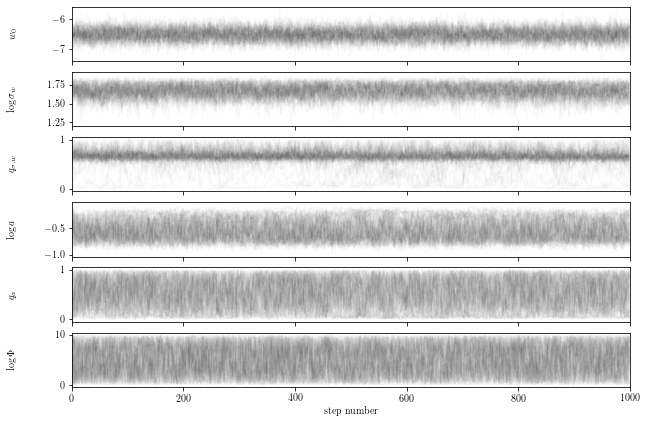

In [46]:
fig, axes = plt.subplots(ndim, figsize=(10, 7), sharex=True)
for i in range(ndim):
    ax = axes[i]
    ax.plot(chain_thin[:, :, i], "k", alpha=0.02)
    ax.set_xlim(0, len(chain_thin))
    ax.set_ylabel(labels[i])
    ax.yaxis.set_label_coords(-0.1, 0.5)
axes[-1].set_xlabel("step number");

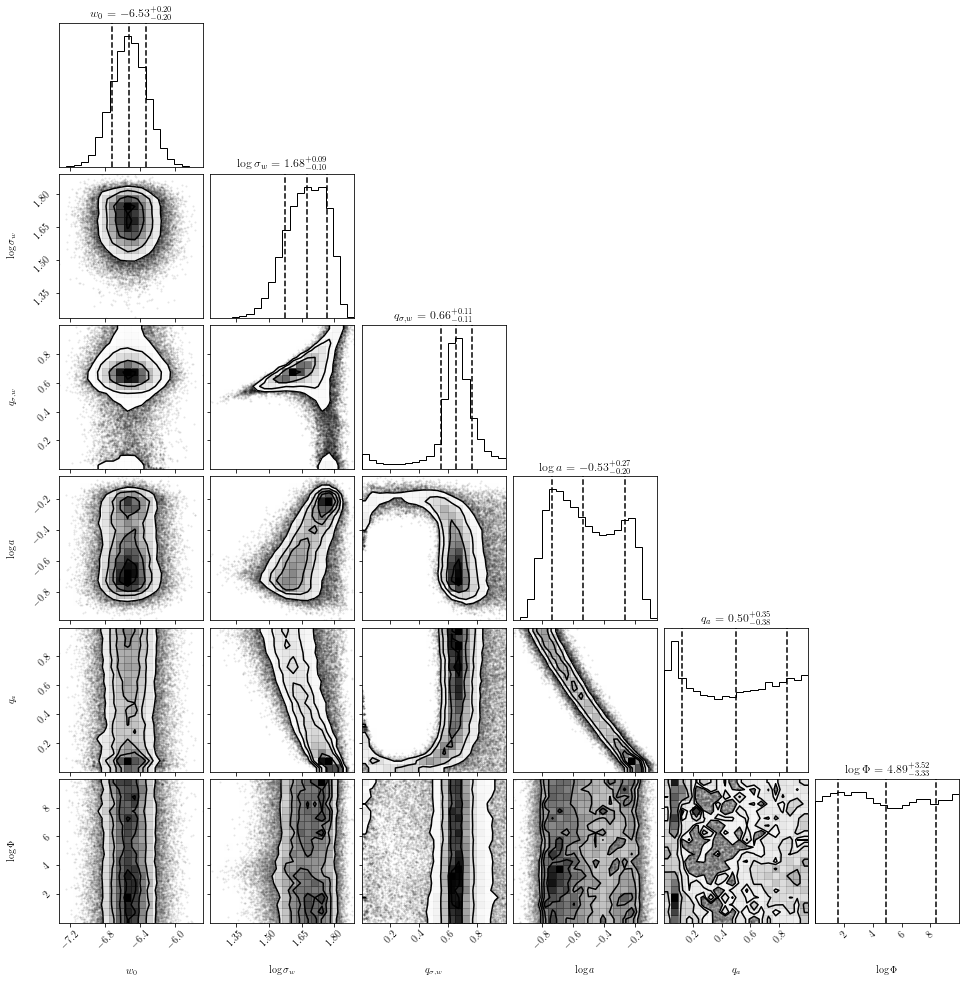

In [47]:
import corner
flat_samples = chain_thin.reshape(-1, ndim)

fig = corner.corner(
    flat_samples, labels=labels, quantiles=[0.16, 0.5, 0.84], show_titles=True
);

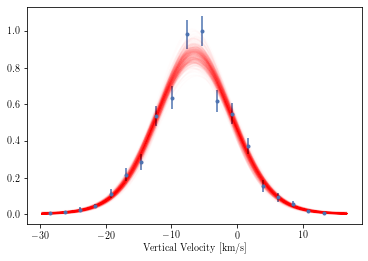

In [48]:
from hammer import vel

ws = np.linspace(wedge.min(), wedge.max(), 1000)

# plot
plt.errorbar(wmid, wnum, yerr=werr, fmt='.', label="data")
for i in range(400):
    th = flat_samples[np.random.randint(len(flat_samples))]
    plt.plot(ws, vel.fw(ws, th), alpha=0.01, color='r')
plt.xlabel("Vertical Velocity [km/s]")
plt.show()

## automate

In [49]:
def create_init():
    # init
    w0_init = {'low': -15, 'high': 0., 'value': -7., 'label': r'$w_0$', 'lab': 'w0'}
    log_sigmaw_init = {'low': 0., 'high': 5., 'value': 2.4, 'label': r'$\log \sigma_w$', 'lab': 'log_sigmaw'}
    q_sigmaw_init = {'low': 0., 'high': 1., 'value': 0.5, 'label': r'$q_{\sigma,w}$', 'lab': 'q_sigmaw'}
    log_a_init = {'low': -1., 'high': 1., 'value': np.log(0.7), 'label': r'$\log a$', 'lab': 'log_a'}
    q_a_init = {'low': 0., 'high': 1., 'value': 0.5, 'label': r'$q_a$', 'lab': 'q_a'}
    log_phi_init = {'low': -15, 'high': 15., 'value': 2., 'label': r'$\log \Phi$', 'lab': 'log_phi'}

    init = [w0_init, log_sigmaw_init, q_sigmaw_init, log_a_init, q_a_init, log_phi_init]
    return init

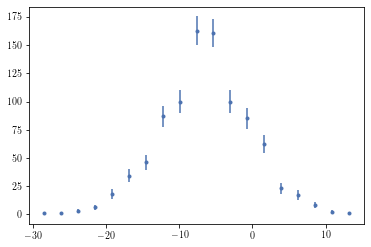

100%|██████████| 100000/100000 [00:15<00:00, 6662.07it/s]


[[0 2 3 ... 8 2 1]
 [0 2 3 ... 9 2 1]
 [0 2 3 ... 8 2 1]
 ...
 [1 1 3 ... 9 2 1]
 [0 2 4 ... 8 2 1]
 [1 1 3 ... 8 2 1]]


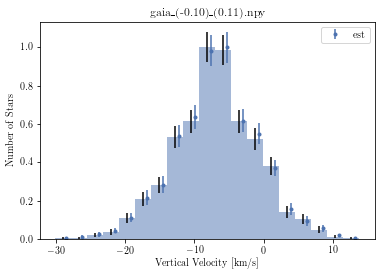

mcmc: 100%|██████████| 5/5 [00:07<00:00,  1.55s/it]


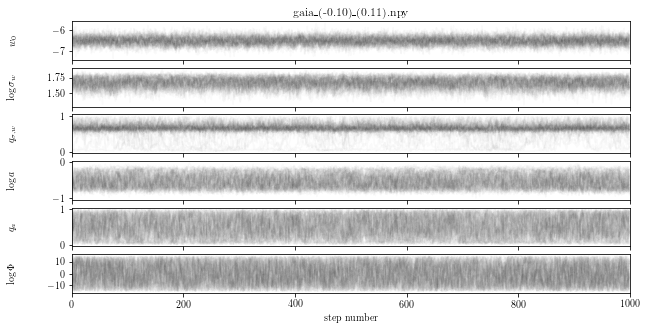

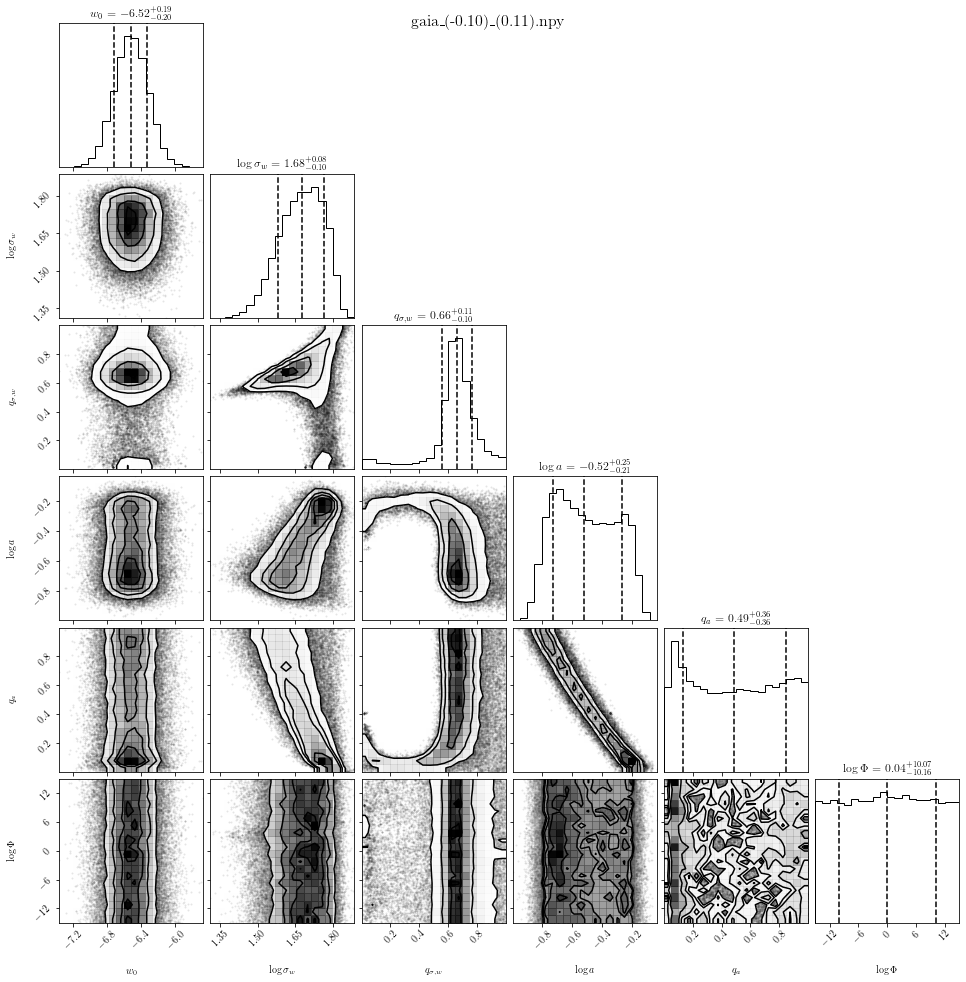

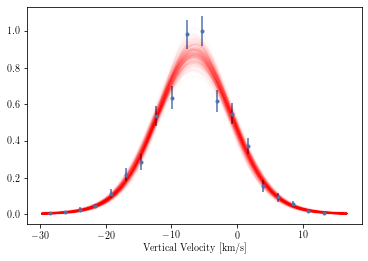

2.74658203125 MB
gaia_(-0.10)_(0.11).npy done


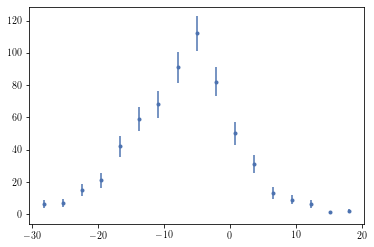

100%|██████████| 100000/100000 [00:11<00:00, 8382.45it/s]


[[ 6  9 12 ...  8  2  2]
 [ 6  9 10 ...  7  1  2]
 [ 6  7 10 ...  7  1  2]
 ...
 [ 6  8  9 ...  6  2  3]
 [ 5  9 11 ...  7  1  2]
 [ 6  9 13 ...  8  1  2]]


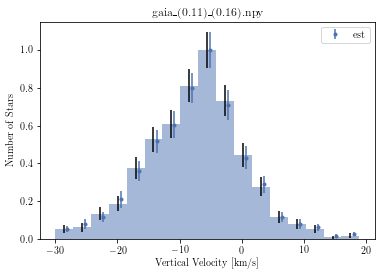

mcmc: 100%|██████████| 5/5 [00:07<00:00,  1.50s/it]


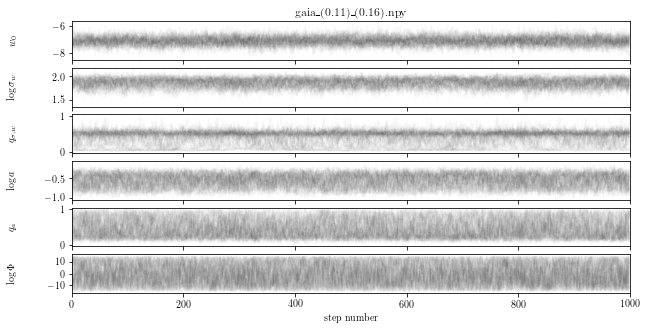

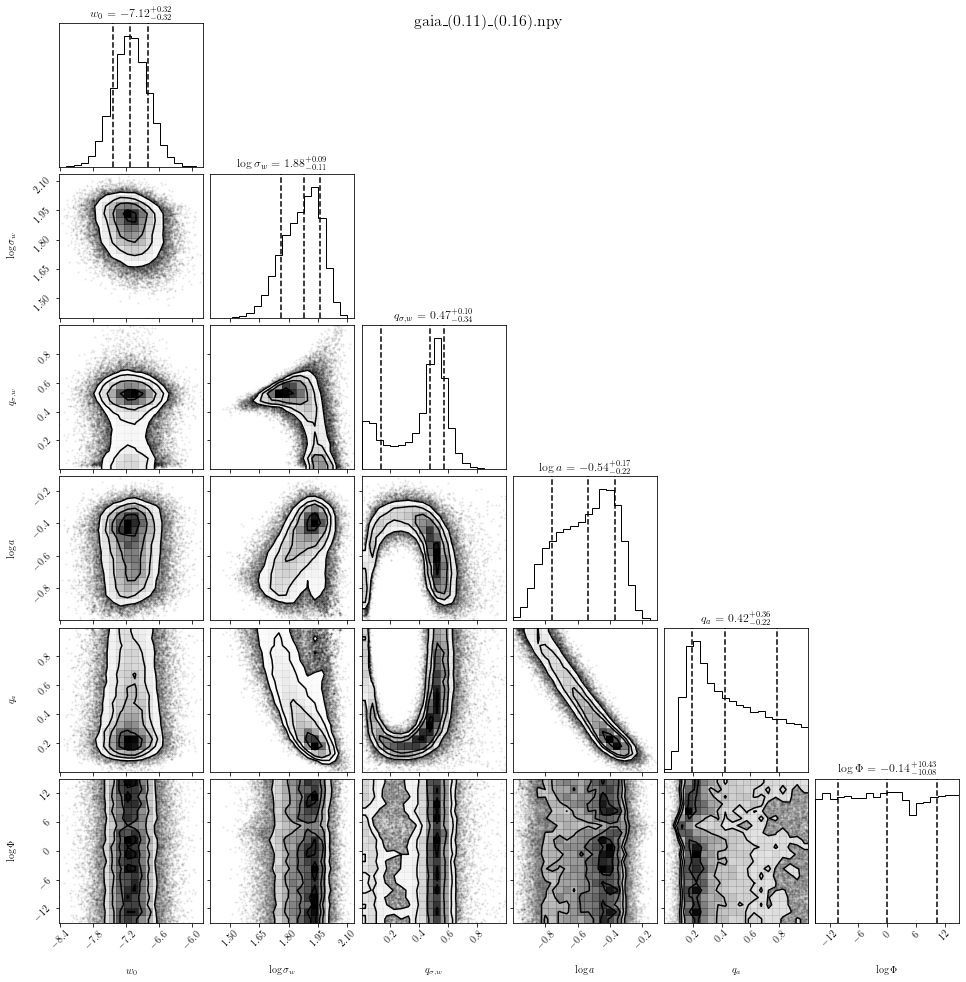

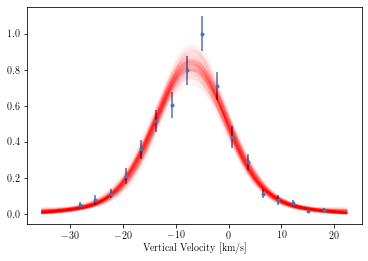

2.74658203125 MB
gaia_(0.11)_(0.16).npy done


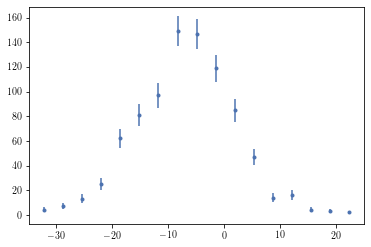

100%|██████████| 100000/100000 [00:14<00:00, 6785.53it/s]


[[ 3  7 12 ...  4  3  2]
 [ 3  8 12 ...  4  3  2]
 [ 4  7 13 ...  4  3  2]
 ...
 [ 3  7 13 ...  4  3  2]
 [ 3  8 13 ...  4  3  2]
 [ 5  7 13 ...  4  3  2]]


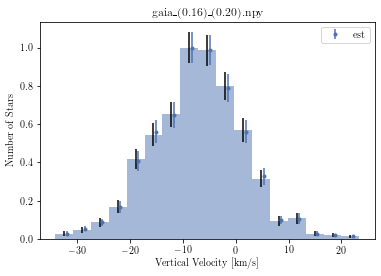

mcmc: 100%|██████████| 5/5 [00:07<00:00,  1.50s/it]


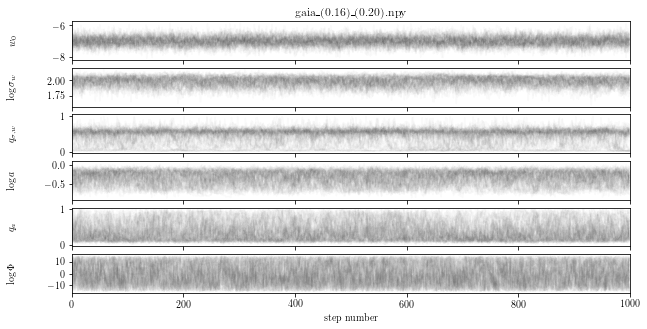

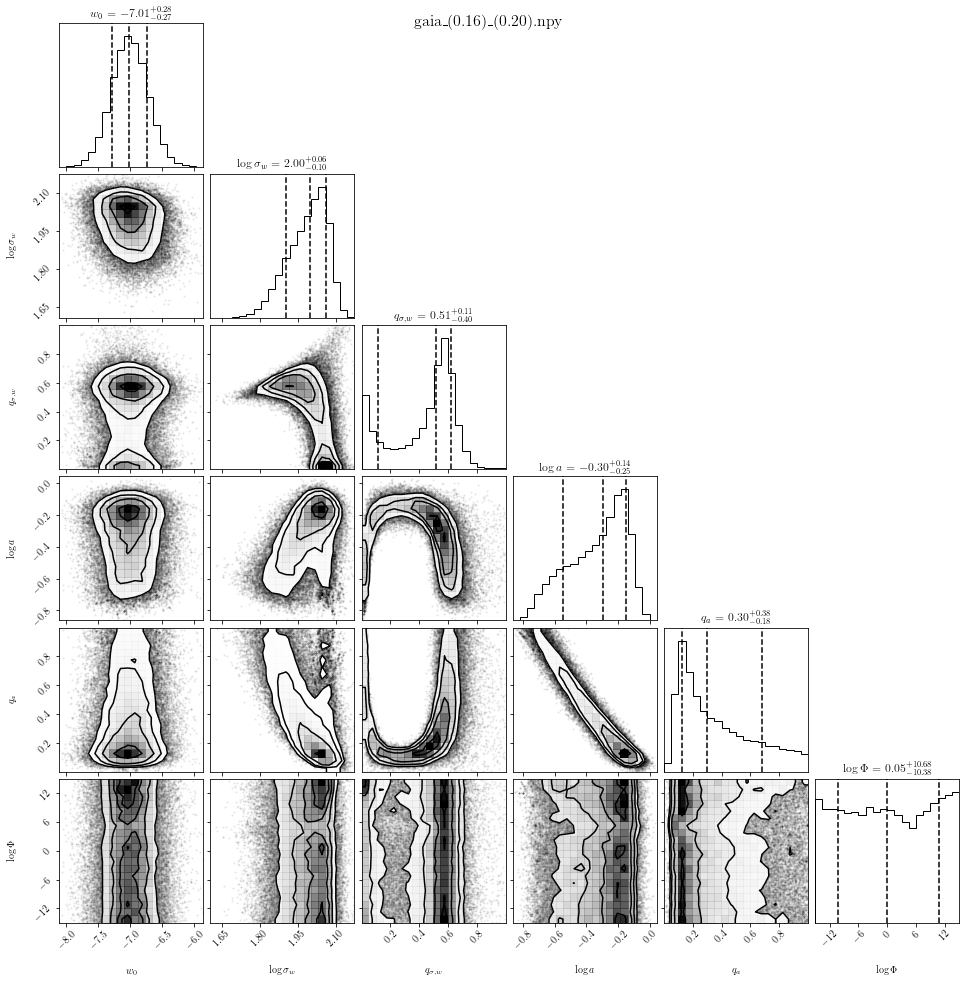

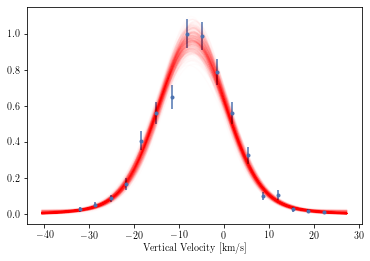

2.74658203125 MB
gaia_(0.16)_(0.20).npy done


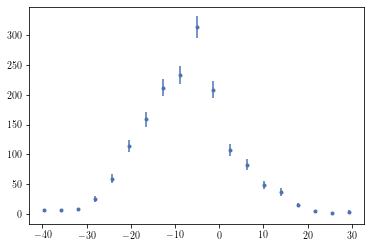

100%|██████████| 100000/100000 [00:23<00:00, 4347.49it/s]


[[6 6 8 ... 4 1 4]
 [6 6 8 ... 5 1 4]
 [5 7 8 ... 5 1 4]
 ...
 [6 6 8 ... 5 1 4]
 [6 6 8 ... 5 2 4]
 [5 7 8 ... 5 1 4]]


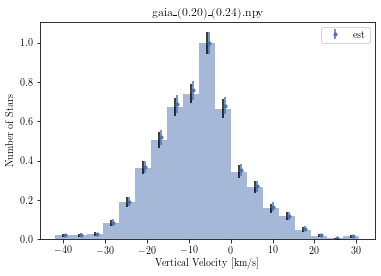

mcmc: 100%|██████████| 5/5 [00:07<00:00,  1.56s/it]


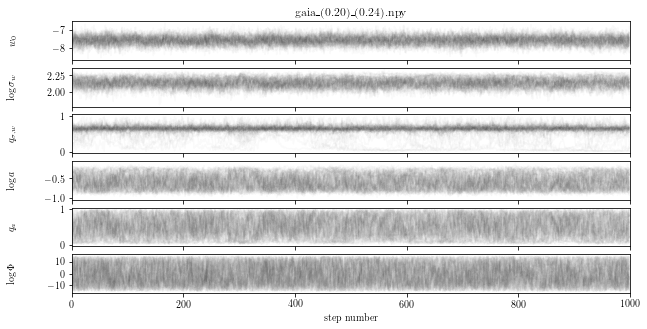

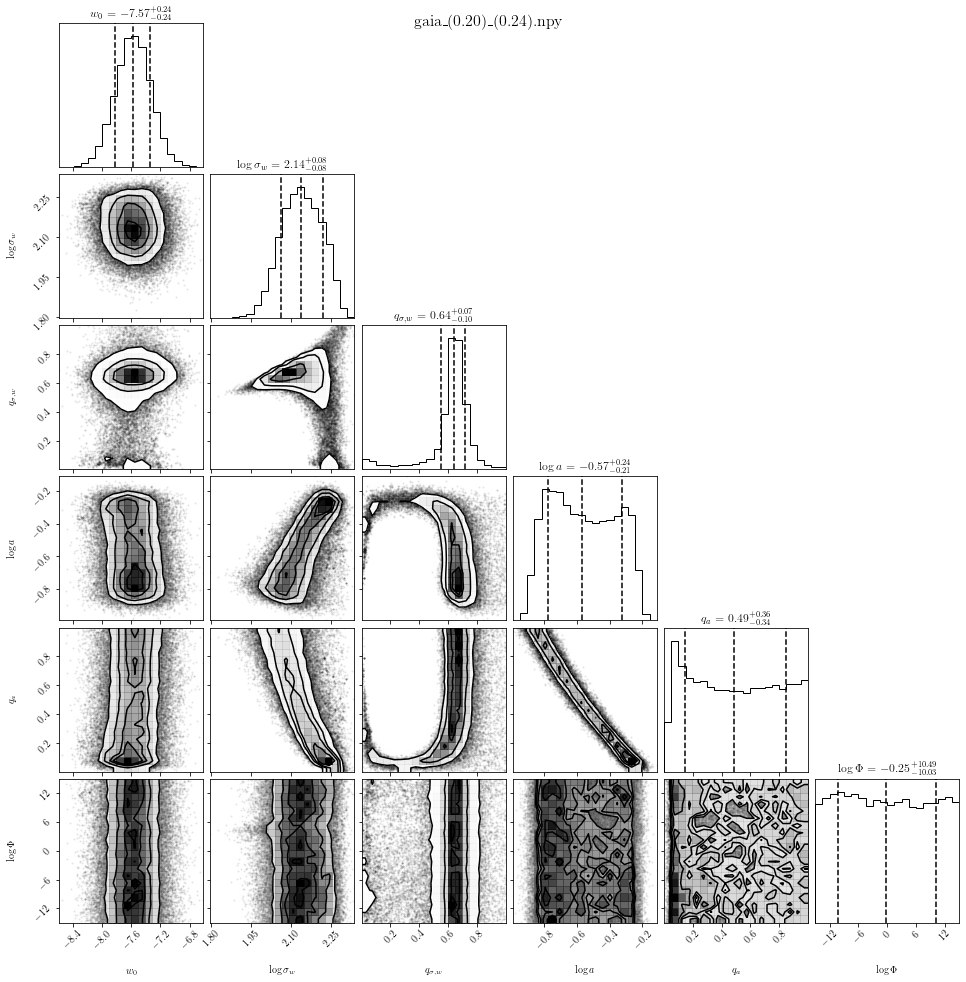

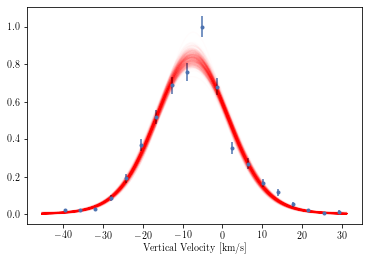

2.74658203125 MB
gaia_(0.20)_(0.24).npy done


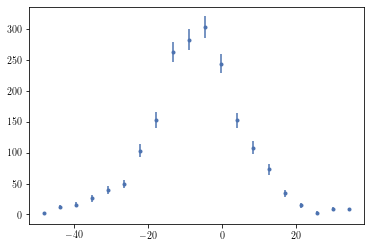

100%|██████████| 100000/100000 [00:25<00:00, 3934.52it/s]


[[ 2 12 17 ...  3 10  7]
 [ 2 12 17 ...  3 10  7]
 [ 3 12 16 ...  3 11  6]
 ...
 [ 2 12 18 ...  3 10  7]
 [ 2 12 15 ...  3 11  6]
 [ 2 12 17 ...  3 10  7]]


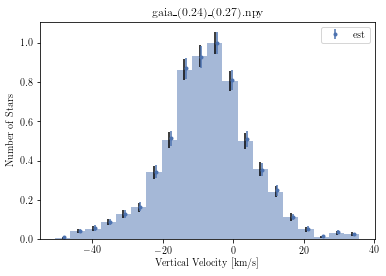

mcmc: 100%|██████████| 5/5 [00:08<00:00,  1.61s/it]


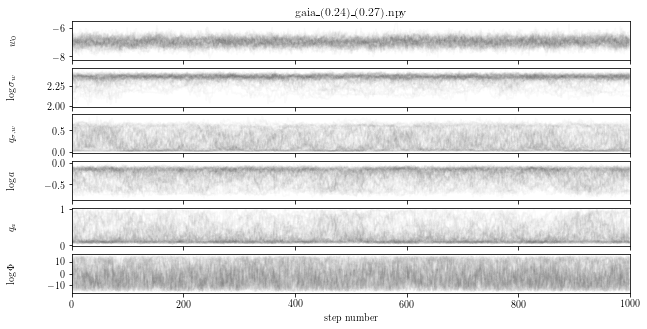

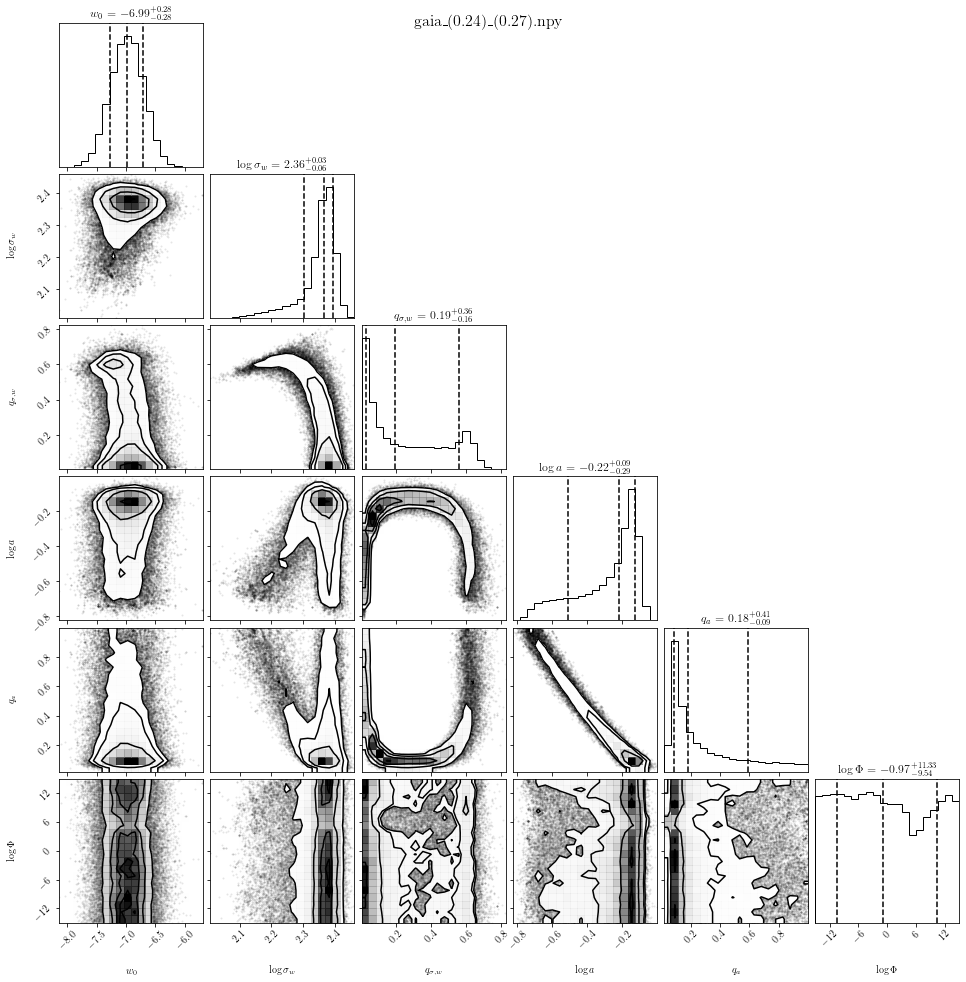

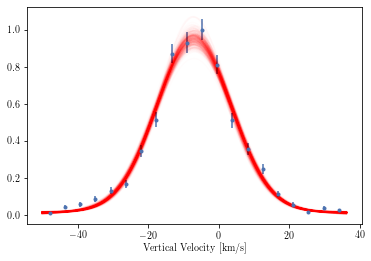

2.74658203125 MB
gaia_(0.24)_(0.27).npy done


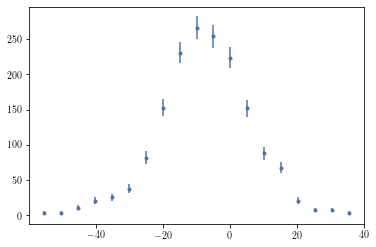

100%|██████████| 100000/100000 [00:23<00:00, 4209.86it/s]


[[ 5  3 11 ...  8  8  4]
 [ 5  3 11 ...  8  8  4]
 [ 4  4 11 ...  8  9  4]
 ...
 [ 6  2 11 ...  9  7  4]
 [ 5  3 11 ...  8  8  4]
 [ 4  3 12 ...  7  9  4]]


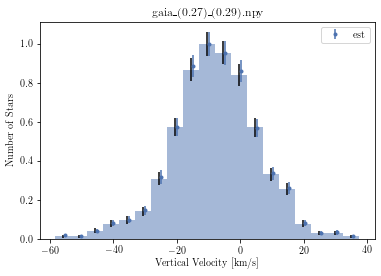

mcmc: 100%|██████████| 5/5 [00:07<00:00,  1.55s/it]


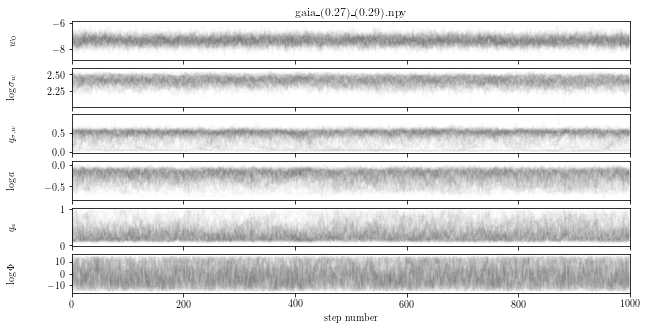

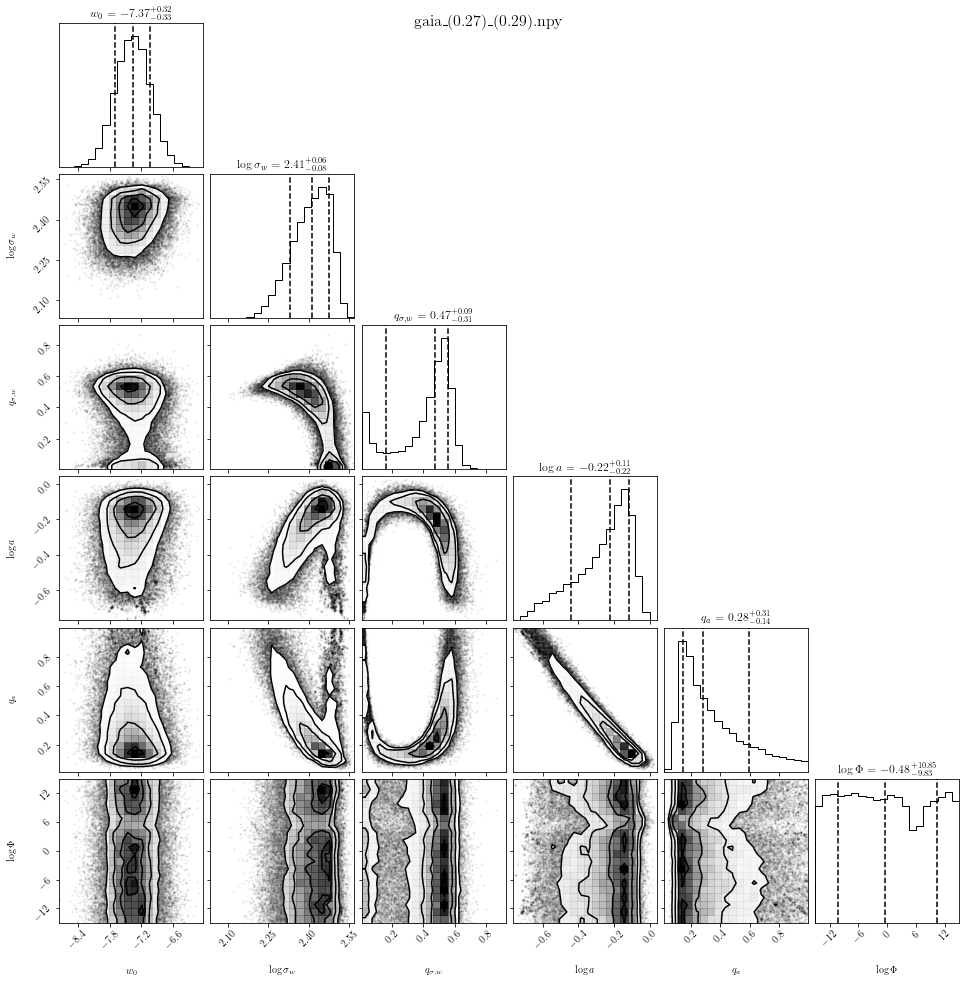

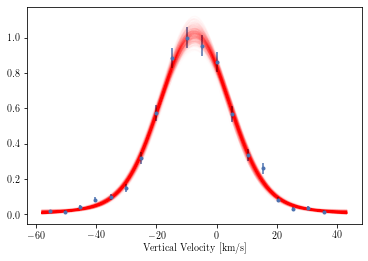

2.74658203125 MB
gaia_(0.27)_(0.29).npy done


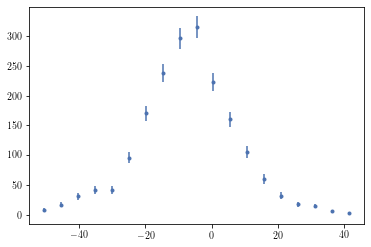

100%|██████████| 100000/100000 [00:25<00:00, 3867.50it/s]


[[ 8 18 31 ... 15  6  3]
 [ 8 18 29 ... 15  6  3]
 [ 7 17 32 ... 15  6  3]
 ...
 [ 8 17 30 ... 15  6  3]
 [ 7 17 31 ... 15  6  3]
 [ 7 17 32 ... 14  6  3]]


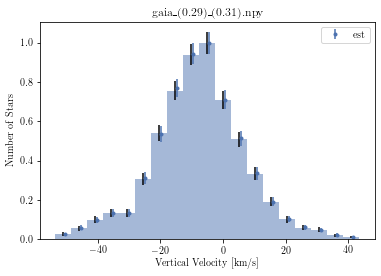

mcmc: 100%|██████████| 5/5 [00:07<00:00,  1.55s/it]


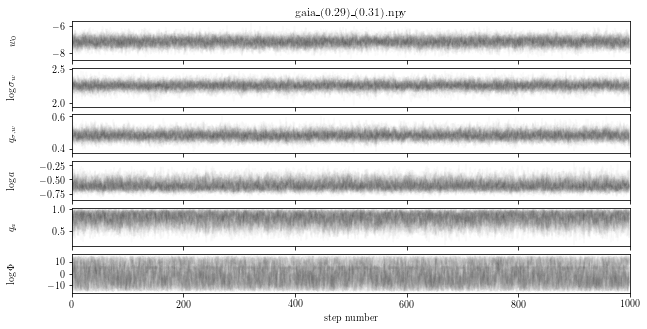

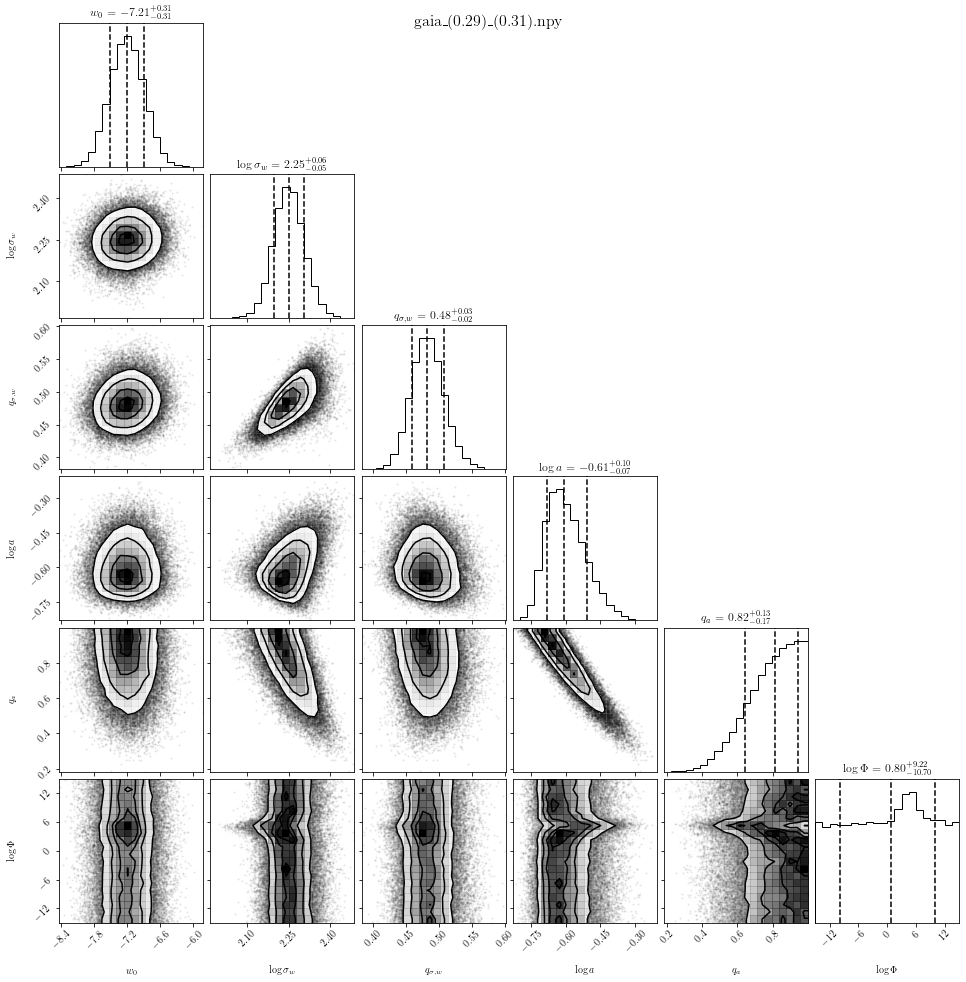

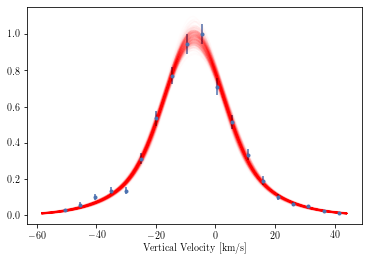

2.74658203125 MB
gaia_(0.29)_(0.31).npy done


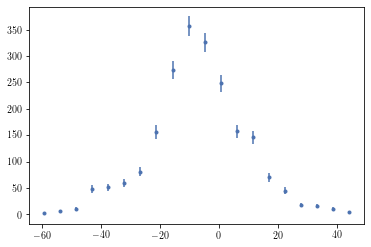

100%|██████████| 100000/100000 [00:28<00:00, 3570.99it/s]


[[ 2  6 10 ... 16 10  4]
 [ 4  6 10 ... 15 10  4]
 [ 2  6 10 ... 16 10  4]
 ...
 [ 3  6 10 ... 15 10  4]
 [ 2  6 10 ... 15 10  4]
 [ 2  6 10 ... 15 10  4]]


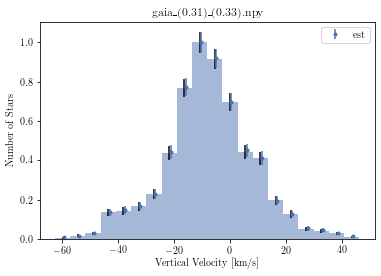

mcmc: 100%|██████████| 5/5 [00:07<00:00,  1.57s/it]


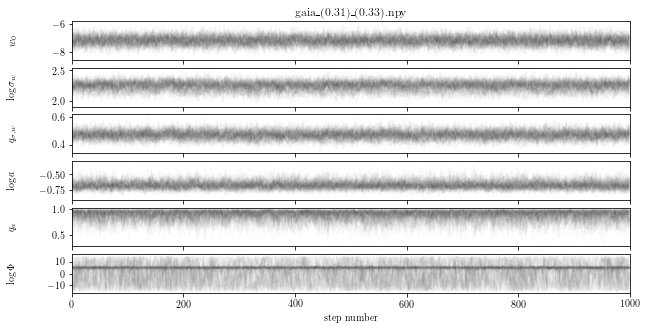

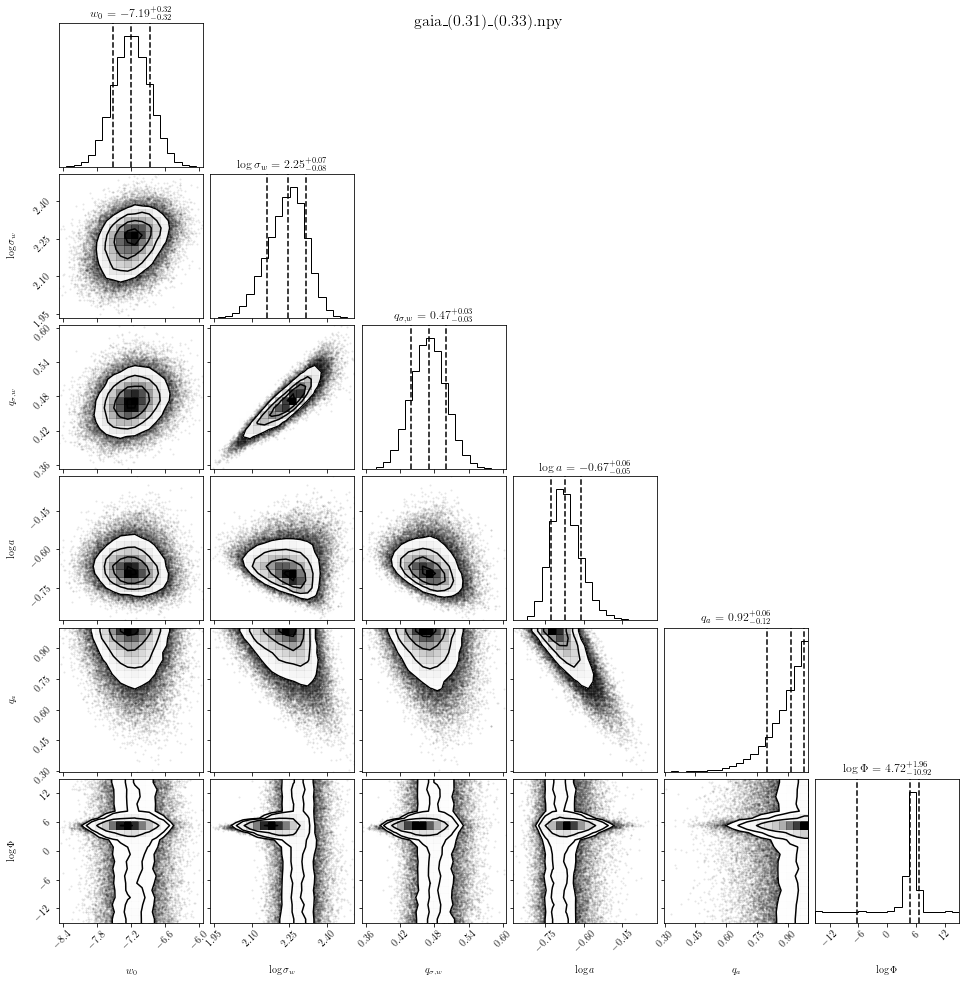

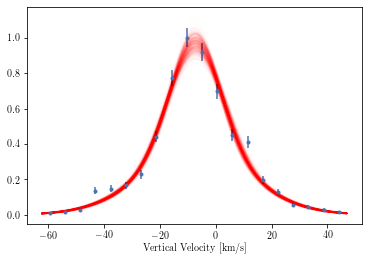

2.74658203125 MB
gaia_(0.31)_(0.33).npy done


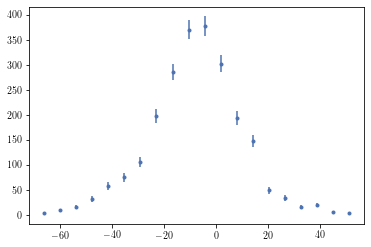

100%|██████████| 100000/100000 [00:29<00:00, 3342.93it/s]


[[ 3  9 15 ... 19  5  4]
 [ 3  9 15 ... 19  5  4]
 [ 3  9 16 ... 19  5  4]
 ...
 [ 3  9 15 ... 19  5  4]
 [ 3  9 15 ... 19  5  4]
 [ 3  9 15 ... 19  5  4]]


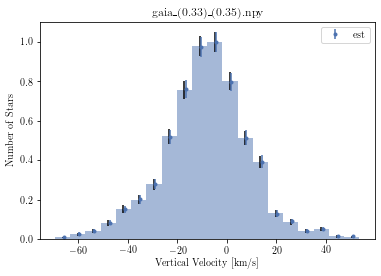

mcmc: 100%|██████████| 5/5 [00:07<00:00,  1.57s/it]


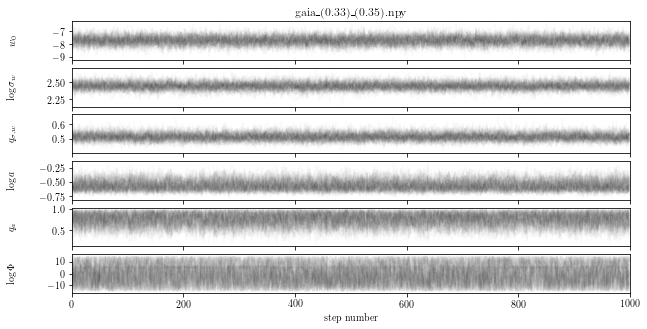

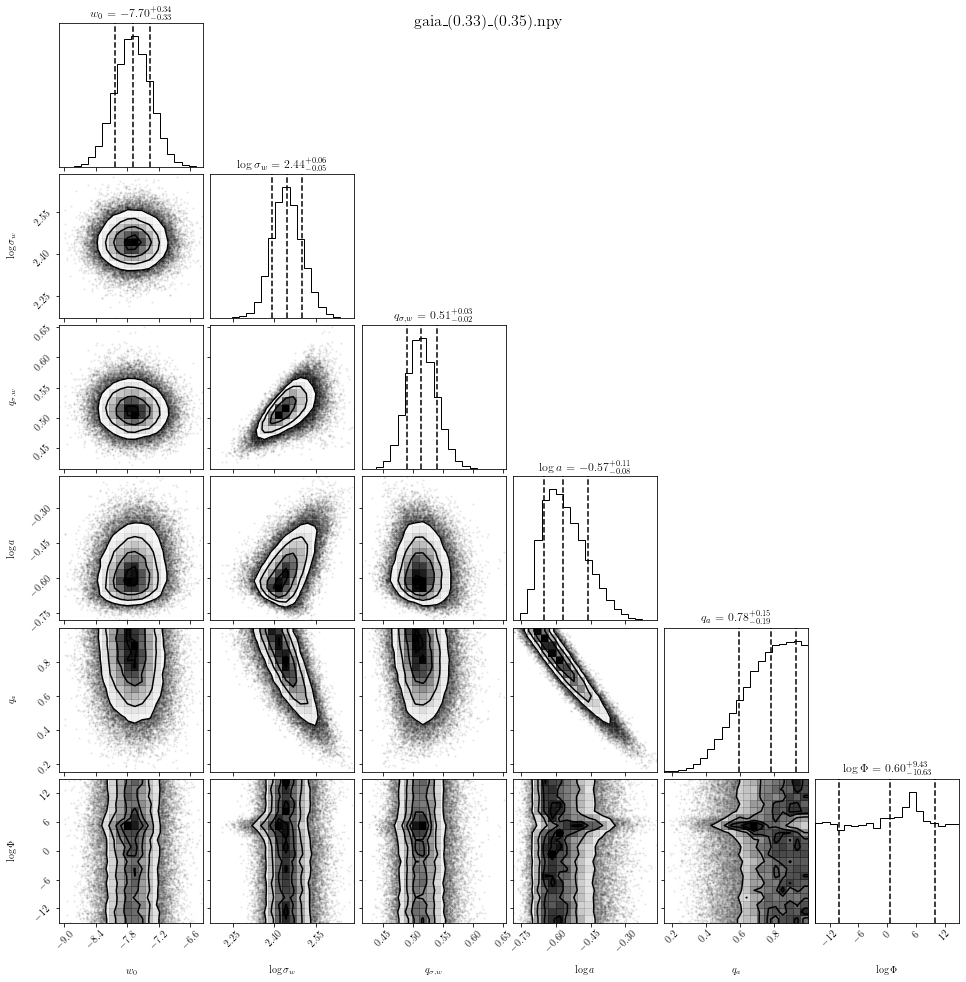

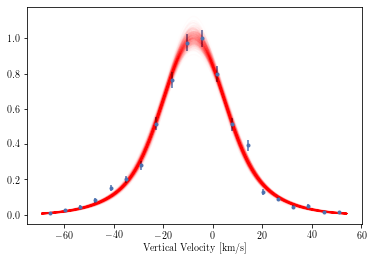

2.74658203125 MB
gaia_(0.33)_(0.35).npy done


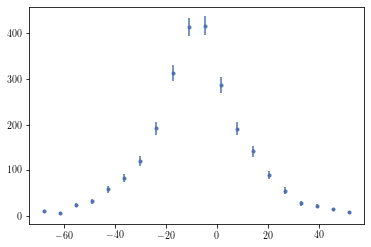

100%|██████████| 100000/100000 [00:32<00:00, 3098.24it/s]


[[10  6 23 ... 21 14  7]
 [10  6 23 ... 21 14  7]
 [11  5 23 ... 21 14  7]
 ...
 [ 9  5 24 ... 21 14  7]
 [ 9  5 24 ... 22 13  7]
 [10  6 23 ... 21 14  7]]


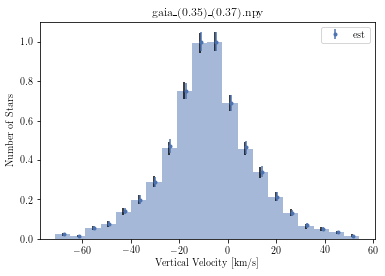

mcmc: 100%|██████████| 5/5 [00:08<00:00,  1.63s/it]


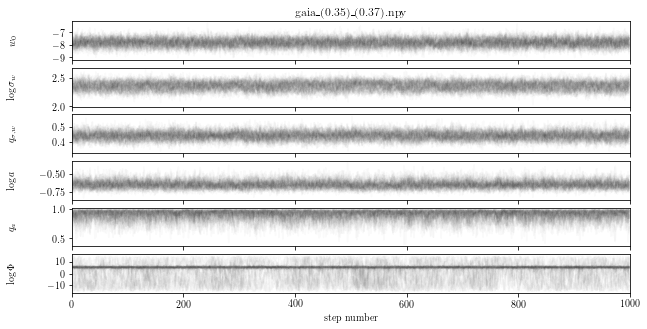

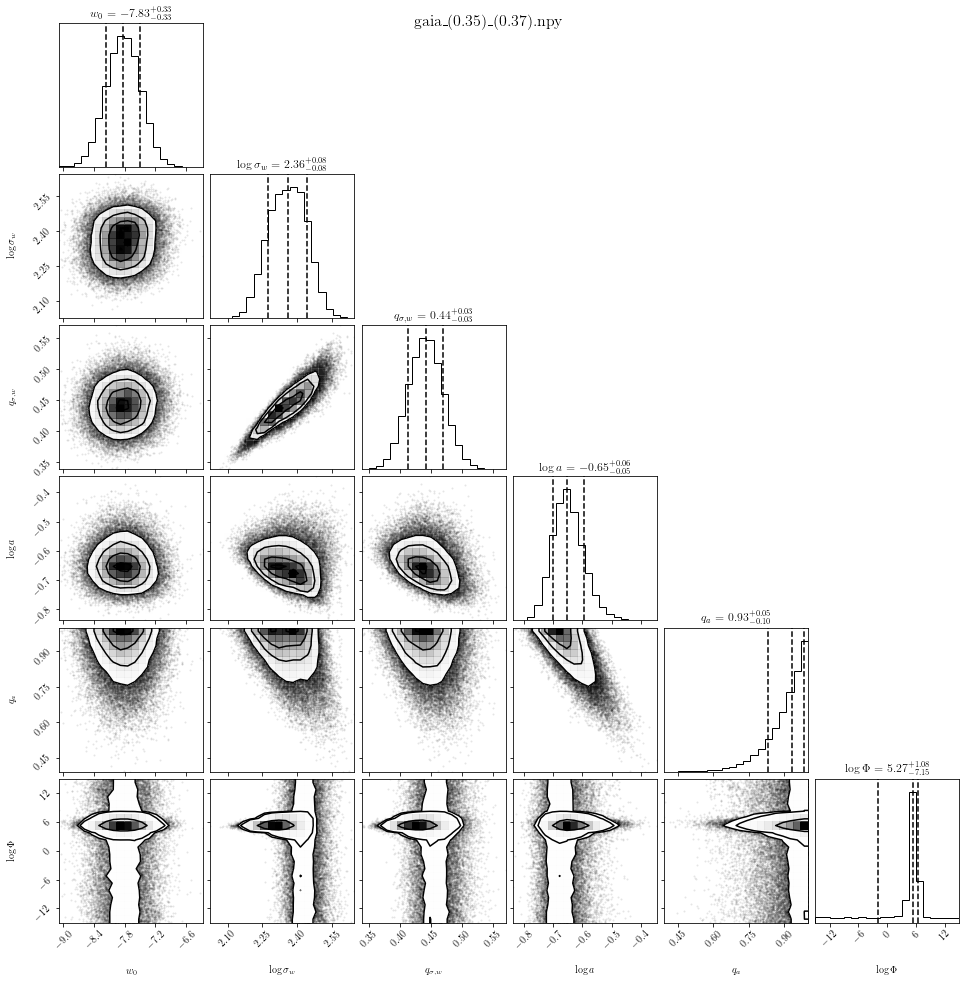

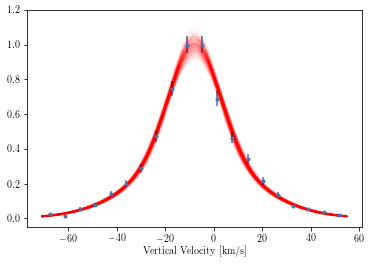

2.74658203125 MB
gaia_(0.35)_(0.37).npy done


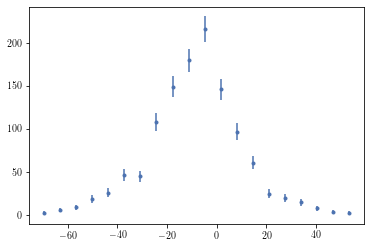

100%|██████████| 100000/100000 [00:18<00:00, 5505.32it/s]


[[3 6 9 ... 8 4 3]
 [3 6 9 ... 8 4 3]
 [3 6 9 ... 8 4 3]
 ...
 [3 6 9 ... 8 4 3]
 [3 6 9 ... 8 4 3]
 [3 6 9 ... 8 4 3]]


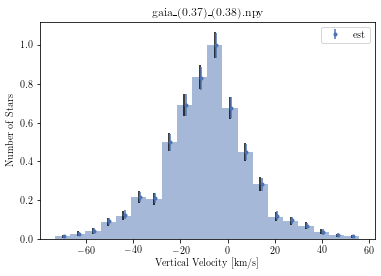

mcmc: 100%|██████████| 5/5 [00:07<00:00,  1.56s/it]


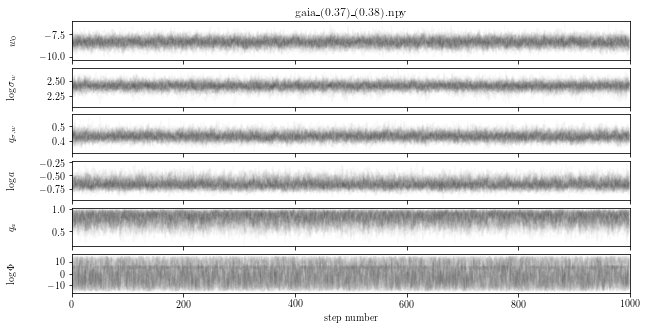

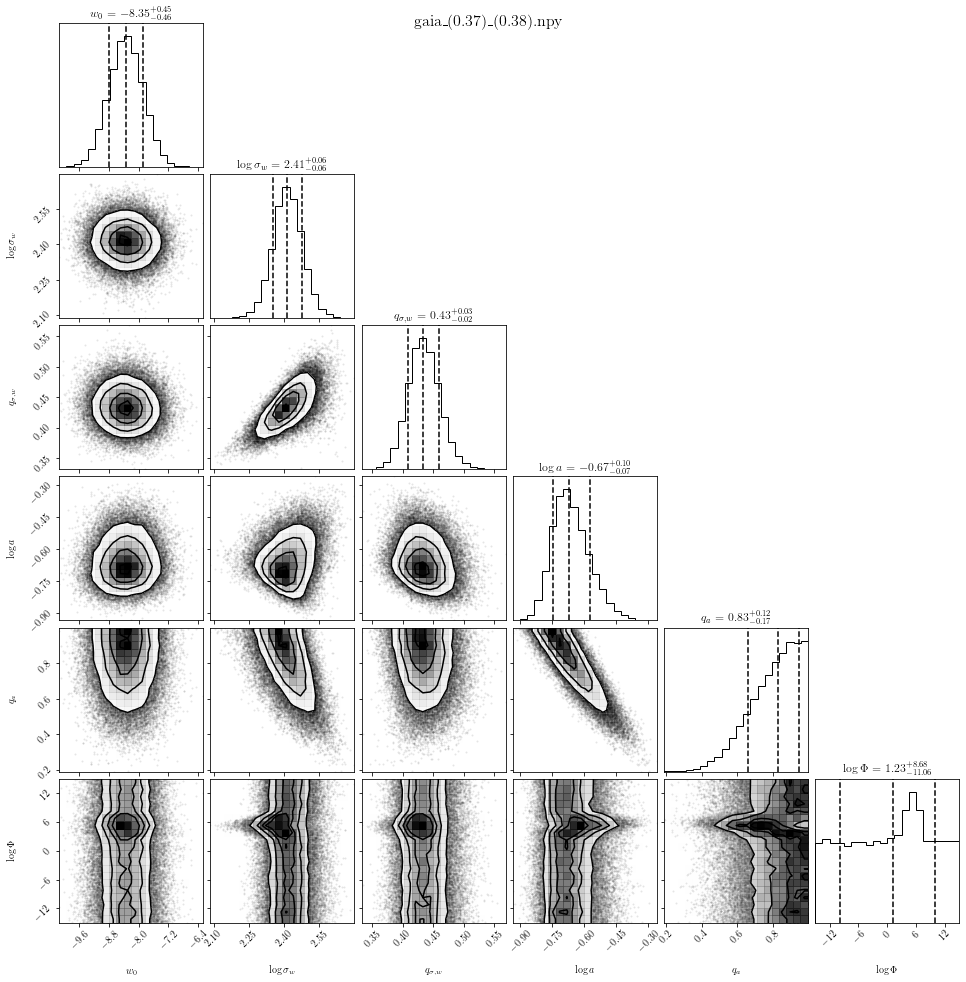

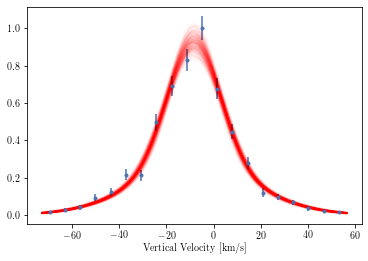

2.74658203125 MB
gaia_(0.37)_(0.38).npy done


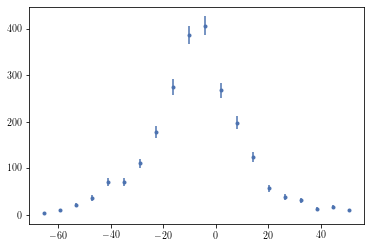

100%|██████████| 100000/100000 [00:30<00:00, 3252.38it/s]


[[ 2  9 20 ... 13 17 10]
 [ 3  9 21 ... 12 18 10]
 [ 3  9 20 ... 13 17 10]
 ...
 [ 3  9 19 ... 13 17 10]
 [ 2  9 20 ... 13 17 10]
 [ 2  9 20 ... 13 17 10]]


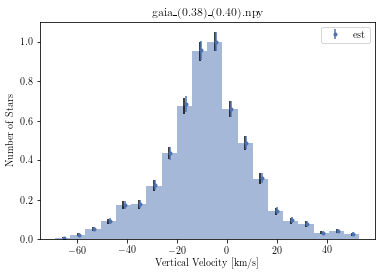

mcmc: 100%|██████████| 5/5 [00:07<00:00,  1.56s/it]


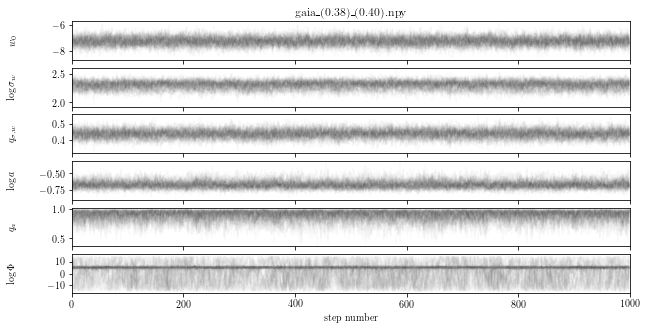

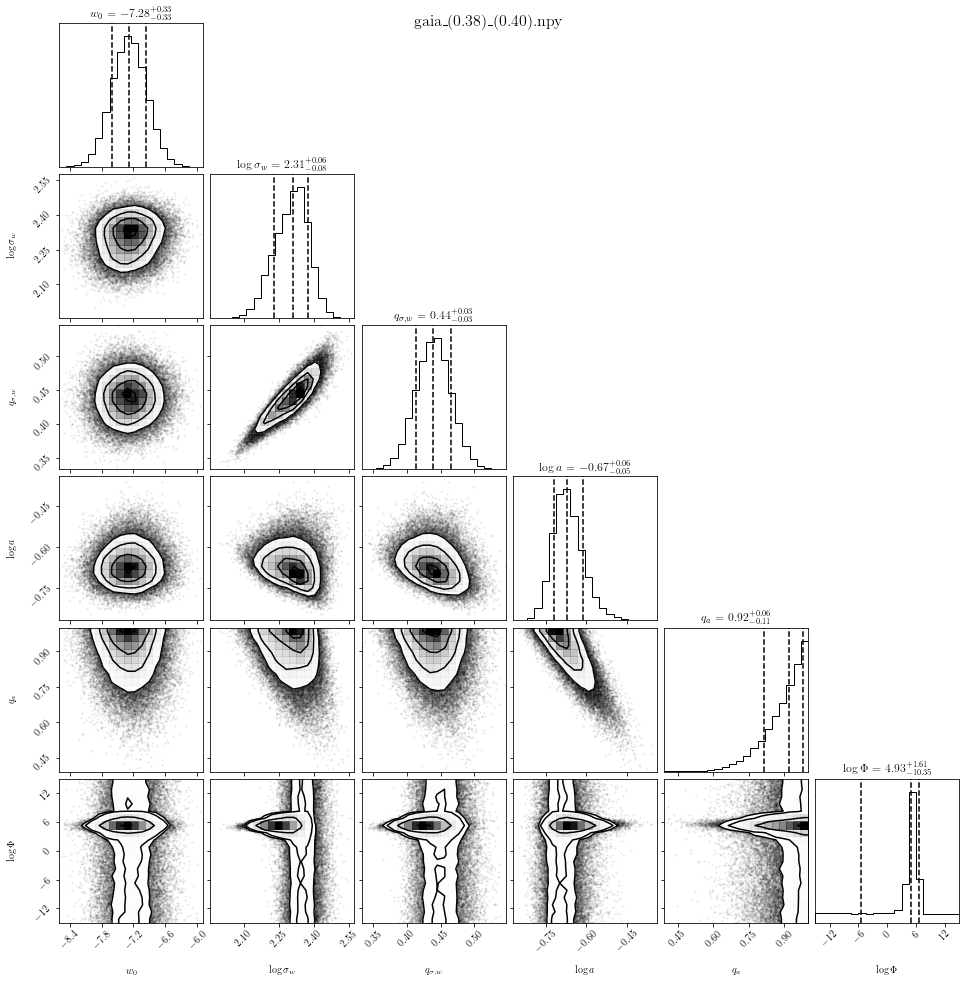

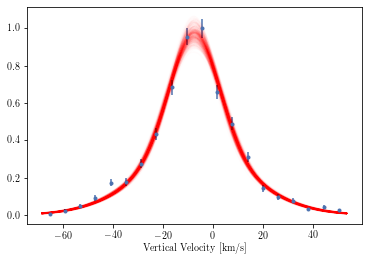

2.74658203125 MB
gaia_(0.38)_(0.40).npy done


In [65]:
ndim = 6
nwalker = 10*ndim
indexes = list(range(ndim))

for file in files:
    name = file.split("/")[-1].replace(".hdf5", ".npy")
    gaia = vaex.open(file)
    
    zs = gaia['z'].to_numpy()
    ws = gaia['w'].to_numpy()
    ews = gaia['e_w'].to_numpy()
    mask = ~np.isnan(ws) & ~np.isnan(ews) & (np.abs(zs) < 50)
    ws = ws[mask]
    ews = ews[mask]
    med = np.median(ws)
    mad = np.median(np.abs(ws-med))
    BIN = 20
    wedge = np.linspace(med-mad*6, med+mad*6, BIN+1)
    dw = wedge[1] - wedge[0]
    wmid = (wedge[1:] + wedge[:-1]) / 2
    wnum, _ = np.histogram(ws, wedge)
    mask = wnum > 0
    wnum = wnum[mask]
    wmid = wmid[mask]
    werr = np.sqrt(wnum)
    plt.errorbar(wmid, wnum, yerr=werr, fmt='.', label="data")
    plt.show()
    BIN = len(wmid)
    # get histogram by including the error
    M = 100_000
    # M = 1_000
    log_w = np.empty(M, dtype=float)
    ns_est = np.empty((M, len(wmid)), dtype=int)
    for i in tqdm(range(M)):
        x_realization = np.random.normal(loc=ws, scale=ews, size=len(ws))
        n_est_i = np.histogram(x_realization, bins=wedge)[0]
        ns_est[i] = n_est_i[mask]
    print(ns_est)
    w_est = np.empty_like(wnum)
    w_err = np.empty_like(wnum)
    for i in range(len(wmid)):
        nw_min = np.floor(ns_est[:, i].min())
        nw_max = np.ceil(ns_est[:, i].max())
        
        bins = np.arange(nw_min-1/2, nw_max+1/2+0.0001)
        # print(bins)
        # print(ns_est[:, i])
        w, n_edge = np.histogram(ns_est[:, i], bins=bins, density=True)
        ns = (n_edge[1:] + n_edge[:-1]) / 2
        mask = w > 0
        w = w[mask]
        ns = ns[mask]
        # plt.plot(ns, w)
        # plt.show()
        m = 6
        lambdas = np.linspace(np.maximum(0, np.floor(wnum[i]-m*werr[i])), np.floor(wnum[i]+m*werr[i]), 10_000)
        dlambda = np.diff(lambdas)
        lambdas = (lambdas[:-1]+lambdas[1:])/2
        pn = np.sum(w[:, None]*poisson.pmf(ns[:,None], lambdas[None, :]), axis=0)
        # plt.plot(lambdas, pn)
        # plt.show()
        area = np.trapz(pn, lambdas)
        pn = pn / area
        mu = np.sum(pn * lambdas * dlambda)
        wi_est = mu
        w_est[i] = wi_est
        Elambda2 = np.sum(pn * lambdas**2 * dlambda)
        sigma2 = Elambda2 - mu**2
        wi_err = np.sqrt(sigma2)
        w_err[i] = wi_err
        # plt.plot(lambdas, pn)
    # done
    # break
    dw = wedge[1]-wedge[0]
    
    plt.bar(wmid-0.5, wnum/wnum.max(), yerr=werr/wnum.max(), width=dw, alpha=0.5)
    plt.errorbar(wmid, w_est/w_est.max(), yerr=w_err/w_est.max(), fmt='.', label="est")
    plt.xlabel("Vertical Velocity [km/s]")
    plt.ylabel("Number of Stars")
    plt.legend()
    plt.title(name)
    plt.show()
    # break
    from scipy.stats import median_abs_deviation as mad
    wnum, werr = w_est/w_est.max(), w_err/w_est.max()
    wdata = (wmid, wnum, werr)
    indexes = list(range(ndim))
    init = create_init()
    theta, locs, scales, labels, labs = generate_init(init)
    
    p0 = vel.generate_p0(nwalker, locs, scales)
    chain = vel.mcmc(2000, p0, wdata, locs, scales, parallel=True, verbose=True)

    labs, locs_normal, scales_normal = get_initial_position_normal(labs, init, chain=chain[1000:], indexes=indexes)
    p0 = vel.generate_p0(nwalker, locs_normal, scales_normal, norm=True)
    chain = vel.mcmc(20000, p0, wdata, locs, scales, parallel=True, verbose=True)
    
    labs, locs_normal, scales_normal = get_initial_position_normal(labs, init, chain=chain[1000:], indexes=indexes)
    p0 = vel.generate_p0(nwalker, locs_normal, scales_normal)
    for i in tqdm(range(5), desc="mcmc"):
        chain = vel.mcmc(10000, p0, wdata, locs, scales, parallel=True, verbose=True)
        chain = chain[::10]
        labs, locs_normal, scales_normal = get_initial_position_normal(labs, init, chain=chain[500:], indexes=indexes)
        p0 = vel.generate_p0(nwalker, locs_normal, scales_normal, norm=True)
        chain = vel.mcmc(10000, p0, wdata, locs, scales, parallel=True, verbose=True)
        p0 = chain[-1]
    chain = vel.mcmc(20000, p0, wdata, locs, scales, parallel=True, verbose=True)
    chain_thin = chain[::20]
    fig, axes = plt.subplots(ndim, figsize=(10, 5), sharex=True)
    for i in range(ndim):
        ax = axes[i]
        ax.plot(chain_thin[:, :, i], "k", alpha=0.02)
        ax.set_xlim(0, len(chain_thin))
        ax.set_ylabel(labels[i])
        ax.yaxis.set_label_coords(-0.1, 0.5)
    axes[-1].set_xlabel("step number")
    axes[0].set_title(name)
    plt.show()
    flat_samples = chain_thin.reshape(-1, ndim)

    fig = corner.corner(
        flat_samples, labels=labels, quantiles=[0.16, 0.5, 0.84], show_titles=True
    )
    fig.suptitle(name, fontsize=16)
    plt.show()
    ws = np.linspace(wedge.min(), wedge.max(), 1000)
    # plot
    plt.errorbar(wmid, wnum, yerr=werr, fmt='.', label="data")
    for i in range(400):
        th = flat_samples[np.random.randint(len(flat_samples))]
        plt.plot(ws, vel.fw(ws, th), alpha=0.01, color='r')
    plt.xlabel("Vertical Velocity [km/s]")
    plt.show()
    # break
    np.save(join(data_dir, name), flat_samples)
    # print the memory usage of flat_samples
    print(flat_samples.nbytes/1024/1024, "MB")
    print(name, "done")

# Load

In [66]:
files = glob(join(data_dir, "*.npy"))
files.sort()
files

['/home2/s20321005/Thesis-Project/Data/Velocity-Distribution-no/gaia_(-0.10)_(0.11).npy',
 '/home2/s20321005/Thesis-Project/Data/Velocity-Distribution-no/gaia_(0.11)_(0.16).npy',
 '/home2/s20321005/Thesis-Project/Data/Velocity-Distribution-no/gaia_(0.16)_(0.20).npy',
 '/home2/s20321005/Thesis-Project/Data/Velocity-Distribution-no/gaia_(0.20)_(0.24).npy',
 '/home2/s20321005/Thesis-Project/Data/Velocity-Distribution-no/gaia_(0.24)_(0.27).npy',
 '/home2/s20321005/Thesis-Project/Data/Velocity-Distribution-no/gaia_(0.27)_(0.29).npy',
 '/home2/s20321005/Thesis-Project/Data/Velocity-Distribution-no/gaia_(0.29)_(0.31).npy',
 '/home2/s20321005/Thesis-Project/Data/Velocity-Distribution-no/gaia_(0.31)_(0.33).npy',
 '/home2/s20321005/Thesis-Project/Data/Velocity-Distribution-no/gaia_(0.33)_(0.35).npy',
 '/home2/s20321005/Thesis-Project/Data/Velocity-Distribution-no/gaia_(0.35)_(0.37).npy',
 '/home2/s20321005/Thesis-Project/Data/Velocity-Distribution-no/gaia_(0.37)_(0.38).npy',
 '/home2/s20321005/T

In [67]:
names = [f.split("/")[-1] for f in files]
names

['gaia_(-0.10)_(0.11).npy',
 'gaia_(0.11)_(0.16).npy',
 'gaia_(0.16)_(0.20).npy',
 'gaia_(0.20)_(0.24).npy',
 'gaia_(0.24)_(0.27).npy',
 'gaia_(0.27)_(0.29).npy',
 'gaia_(0.29)_(0.31).npy',
 'gaia_(0.31)_(0.33).npy',
 'gaia_(0.33)_(0.35).npy',
 'gaia_(0.35)_(0.37).npy',
 'gaia_(0.37)_(0.38).npy',
 'gaia_(0.38)_(0.40).npy']

In [68]:
import re

# capture string within parenthesis ()

c = [re.findall(r'\((.*?)\)', name) for name in names]
c0 = np.array([float(ci[0]) for ci in c])
c1 = np.array([float(ci[1]) for ci in c])
c = (c0+c1)/2
c

array([0.005, 0.135, 0.18 , 0.22 , 0.255, 0.28 , 0.3  , 0.32 , 0.34 ,
       0.36 , 0.375, 0.39 ])

In [69]:
from scipy.integrate import simps
from hammer import vel

Ew = np.empty((len(c), 60_000))
Ew2 = np.empty((len(c), 60_000))
ws = np.linspace(-100, 100, 1000)
for i, file in enumerate(tqdm(files)):
    flat_samples = np.load(file)
    fw = np.empty((60_000, len(ws)))
    for j in range(60_000):
        fw[j] = vel.fw(ws, flat_samples[j])
    mean = simps(fw*ws[None, :],ws[None, :], axis=1)/simps(fw,ws[None, :], axis=1)
    rms = simps(fw*ws[None, :]*ws[None, :],ws[None, :], axis=1)/simps(fw,ws[None, :], axis=1)
    Ew[i] = mean
    Ew2[i] = rms

100%|██████████| 12/12 [02:12<00:00, 11.05s/it]


In [70]:
variances = Ew2 - Ew*Ew
means = Ew
sigmas = np.sqrt(variances)

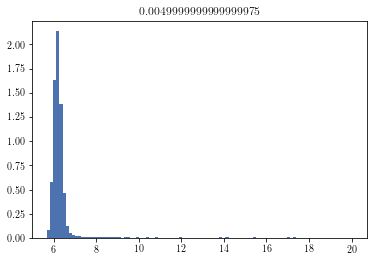

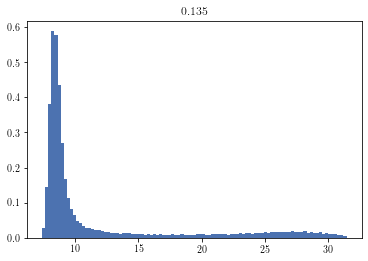

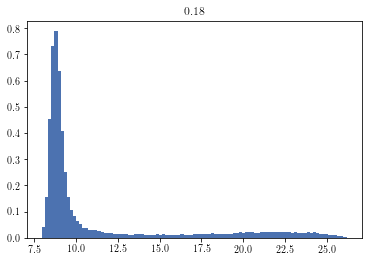

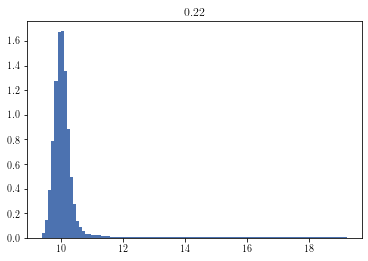

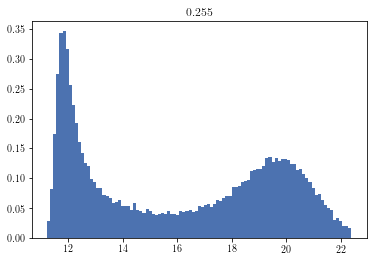

...

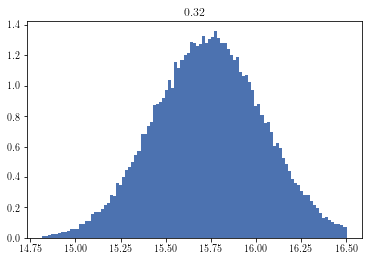

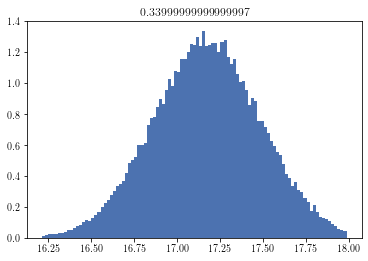

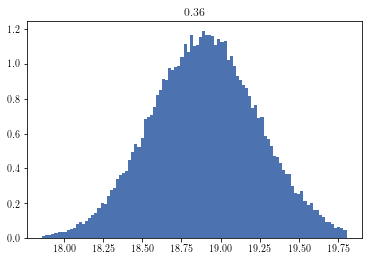

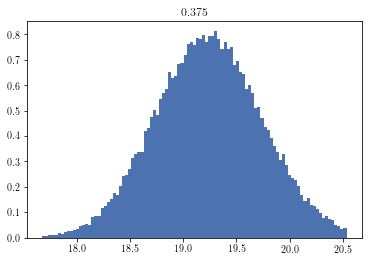

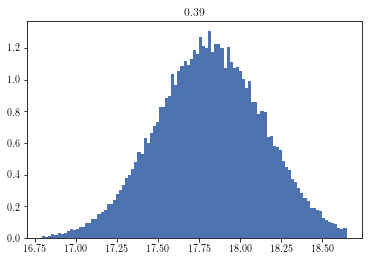

In [71]:
for ci, sig in zip(c, sigmas):
    edge = np.linspace(np.percentile(sig, 0.1), np.percentile(sig, 99.4), 100)
    plt.hist(sig, bins=edge, density=True)
    plt.title(ci)
    plt.show()

In [72]:
mean_w0 = np.mean(means, axis=1)
sigma_w0 = np.std(means, axis=1)

<ErrorbarContainer object of 3 artists>

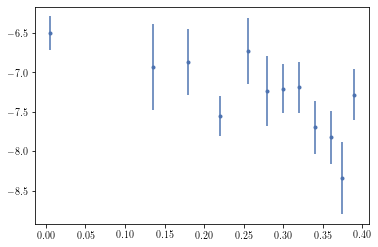

In [73]:
plt.errorbar(c, mean_w0, yerr=sigma_w0, fmt='.')

In [74]:
mean_sigmaw = np.mean(sigmas, axis=1)
sigma_sigmaw = np.std(sigmas, axis=1) 

<ErrorbarContainer object of 3 artists>

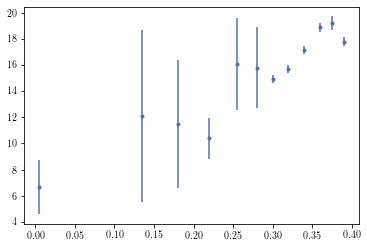

In [75]:
plt.errorbar(c, mean_sigmaw, yerr=sigma_sigmaw, fmt='.')

In [81]:
np.repeat(median_sigmaw, 60_000).reshape(-1, 60_000).shape

(12, 60000)

In [82]:
median_sigmaw = np.median(sigmas, axis=1)
mad_sigmaw = np.median(np.abs(sigmas-np.repeat(median_sigmaw, 60_000).reshape(-1, 60_000)), axis=1)

<ErrorbarContainer object of 3 artists>

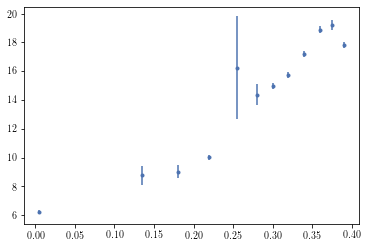

In [83]:
plt.errorbar(c, median_sigmaw, yerr=mad_sigmaw, fmt='.')

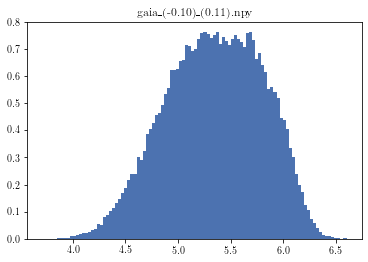

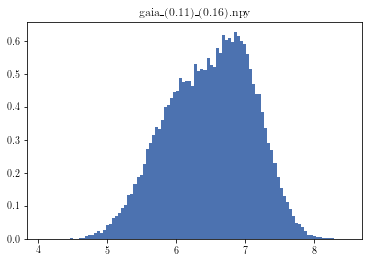

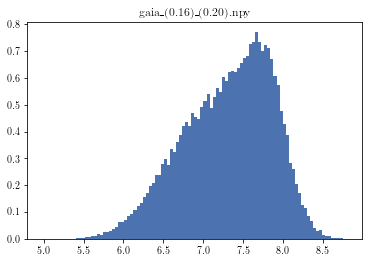

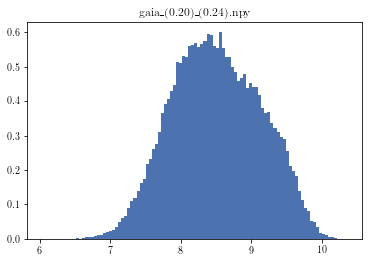

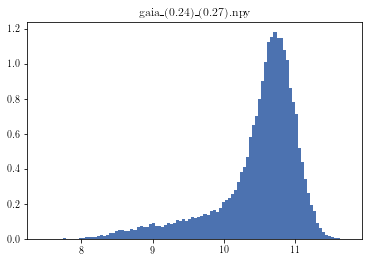

...

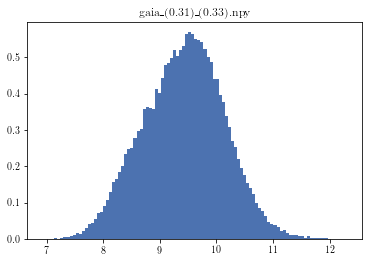

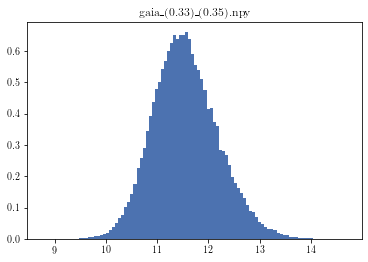

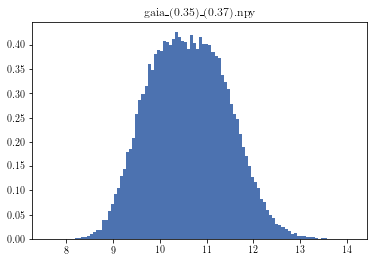

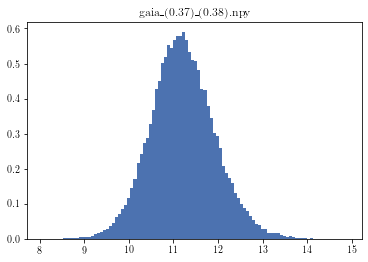

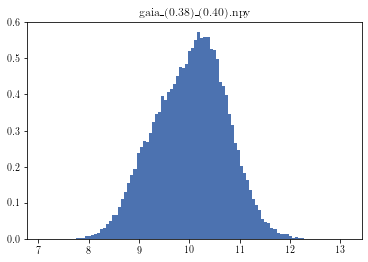

In [88]:
from scipy.integrate import simps
from hammer import vel

sigmaw = np.empty((len(c), 60_000))
ws = np.linspace(-100, 100, 1000)
for i, file in enumerate(files):
    flat_samples = np.load(file)
    sigmaw_i = np.exp(flat_samples[:,1])
    plt.hist(sigmaw_i, bins=100, density=True)
    plt.title(file.split("/")[-1])
    plt.show()
    sigmaw[i] = sigmaw_i

In [89]:
mean_sigmaw = np.mean(sigmaw, axis=1)
std_sigmaw = np.std(sigmaw, axis=1)

<ErrorbarContainer object of 3 artists>

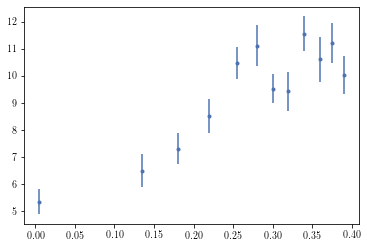

In [90]:
plt.errorbar(c, mean_sigmaw, yerr=std_sigmaw, fmt='.')

In [ ]:
from scipy.integrate import simps
from hammer import vel

Ew = np.empty((len(c), 60_000))
Ew2 = np.empty((len(c), 60_000))
ws = np.linspace(-100, 100, 1000)
for i, file in enumerate(tqdm(files)):
    flat_samples = np.load(file)
    fw = np.empty((60_000, len(ws)))
    for j in range(60_000):
        fw[j] = vel.fw(ws, flat_samples[j])
    mean = simps(fw*ws[None, :],ws[None, :], axis=1)/simps(fw,ws[None, :], axis=1)
    rms = simps(fw*ws[None, :]*ws[None, :],ws[None, :], axis=1)/simps(fw,ws[None, :], axis=1)
    Ew[i] = mean
    Ew2[i] = rms# LEGACY

In [29]:
# fit with double gaussian
from scipy.stats import norm
from scipy.optimize import curve_fit

def gaussian(x, mu, sigma, a):
    return abs(a)*norm.pdf(x, mu, sigma)

def double_gaussian(x, mu, sigma1, a1, sigma2, a2):
    return abs(a1)*norm.pdf(x, mu, sigma1) + abs(a2)*norm.pdf(x, mu, sigma2)

In [30]:
# index = int(input("Index: "))
def get_fit(index, wedge):
    name = files[index].split("/")[-1]
    gaia_raw = vaex.open(files[index])
    gaia = gaia_raw.filter("abs(z)<50")
    gaia['f'] = gaia_raw.evaluate("e_w/abs(w)")
    mask = (gaia['f']<0.1) | (gaia['e_w']<1)
    gaia = gaia[mask]
    gaia = gaia.extract()
    ws = gaia['w'].to_numpy()
    wmid = (wedge[1:] + wedge[:-1]) / 2
    wnum, _ = np.histogram(ws, wedge)
    mask = wnum > 0
    wmid = wmid[mask]
    wnum = wnum[mask]
    print(len(ws), index)
    area = wnum.sum() * (wedge[1] - wedge[0])

    popt1, _ = curve_fit(gaussian, wmid, wnum/area, p0=[0, 10, 1])
    popt2 = None
    for i in range(100):
        # p0 = np.array([popt1[0], popt1[1]*0.8, popt1[2]*0.8, popt1[1]*1.2, popt1[2]/1.2])
        p0 = [popt1[0], popt1[1], 0.9, 50, 0.07]
        # noise = np.random.normal(0, 0.1, size=len(p0))
        popt, _ = curve_fit(double_gaussian, wmid, wnum/area, p0=p0, maxfev=5000)
        if popt[1] > 1 and popt[3] > 1:
            popt2 = popt
            break
        print('failed to fit', i)
        if i == 99:
            rnd = 0.5
            popt2 = np.array([popt1[0], popt1[1], rnd*popt1[2], popt1[1], (1-rnd)*popt1[2]])

    ws = np.linspace(np.min(wedge),np.max(wedge), 1000)
    fw1 = gaussian(ws, *popt1)
    fw2 = double_gaussian(ws, *popt2)

    werr = np.sqrt(wnum)
    plt.figure(figsize=(10, 6))
    plt.errorbar(wmid, wnum/area, yerr=werr/area, fmt='.')
    plt.plot(ws, fw2, label="Double Gaussian")
    plt.plot(ws, fw1, label="Gaussian")
    plt.plot(ws, gaussian(ws, popt2[0], popt2[1], popt2[2]), label="Gaussian 1", ls="--")
    plt.plot(ws, gaussian(ws, popt2[0], popt2[3], popt2[4]), label="Gaussian 2", ls="--")
    plt.xlabel("Vertical Velocity [km/s]")
    plt.ylabel("Number of Stars")
    plt.ylim(-0.01, np.max(wnum/area)*1.2)
    plt.legend()
    # plt.yscale("log")
    plt.show()
    print("1: mu={:.2f}, sigma={:.2f}, a={:.2f}".format(*popt1))
    print("2: mu={:.2f}, sigma1={:.2f}, a1={:.2f}, sigma2={:.2f}, a2={:.2f}".format(*popt2))

    dic = {
            "mu": popt1[0],
            "sigma": popt1[1],
            "a": abs(popt1[2]),
            "mu_2": popt2[0],
            "sigma1_2": popt2[1],
            "a1_2": abs(popt2[2]),
            "sigma2_2": popt2[3],
            "a2_2": popt2[4],
        }
    df_fit = pd.DataFrame(dic, index=[index])
    df = pd.DataFrame({"wmid": wmid, "wnum": wnum/area, "werr": werr/area})
    return df, df_fit, name

809 0


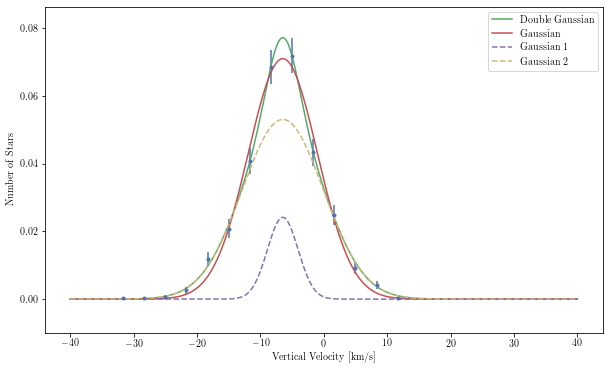

1: mu=-6.45, sigma=5.46, a=0.97
2: mu=-6.46, sigma1=2.41, a1=0.15, sigma2=6.43, a2=0.85
export(hdf5) [########################################] 100.00% elapsed time  :     0.04s =  0.0m =  0.0h
export(hdf5) [########################################] 100.00% elapsed time  :     0.03s =  0.0m =  0.0h
 

In [31]:
wedge = np.linspace(-40, 40, 25)
df, df_fit, name = get_fit(0, wedge)
# df.export(join(data_dir, name), progress=True)
df = vaex.from_pandas(df)
df_fit = vaex.from_pandas(df_fit)

n = name.split("_")
name = f"w_{n[1]}_{n[2]}.hdf5"
df.export(join(data_dir, name), progress=True)
df_fit.export(join(data_dir, "fit_"+name), progress=True)


701 1


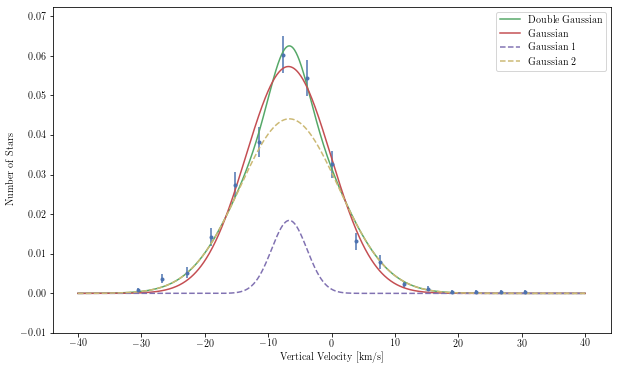

1: mu=-6.80, sigma=6.70, a=0.96
2: mu=-6.66, sigma1=2.79, a1=0.13, sigma2=7.79, a2=0.86
export(hdf5) [########################################] 100.00% elapsed time  :     0.02s =  0.0m =  0.0h
export(hdf5) [########################################] 100.00% elapsed time  :     0.04s =  0.0m =  0.0h
 

In [39]:
wedge = np.linspace(-40, 40, 22)
df, df_fit, name = get_fit(1, wedge)
# df.export(join(data_dir, name), progress=True)
df = vaex.from_pandas(df)
df_fit = vaex.from_pandas(df_fit)

n = name.split("_")
name = f"w_{n[1]}_{n[2]}.hdf5"
df.export(join(data_dir, name), progress=True)
df_fit.export(join(data_dir, "fit_"+name), progress=True)

862 2


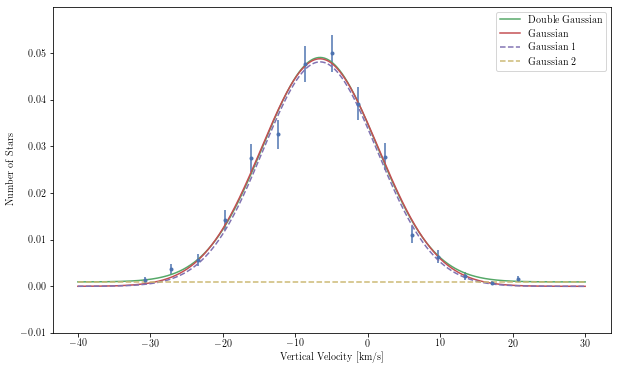

1: mu=-6.60, sigma=8.09, a=0.99
2: mu=-6.59, sigma1=7.86, a1=0.95, sigma2=9201.11, a2=21.82
export(hdf5) [########################################] 100.00% elapsed time  :     0.02s =  0.0m =  0.0h
export(hdf5) [########################################] 100.00% elapsed time  :     0.03s =  0.0m =  0.0h
 

In [40]:
wedge = np.linspace(-40, 30, 20)
df, df_fit, name = get_fit(2, wedge)
# df.export(join(data_dir, name), progress=True)
df = vaex.from_pandas(df)
df_fit = vaex.from_pandas(df_fit)

n = name.split("_")
name = f"w_{n[1]}_{n[2]}.hdf5"
df.export(join(data_dir, name), progress=True)
df_fit.export(join(data_dir, "fit_"+name), progress=True)

1132 3


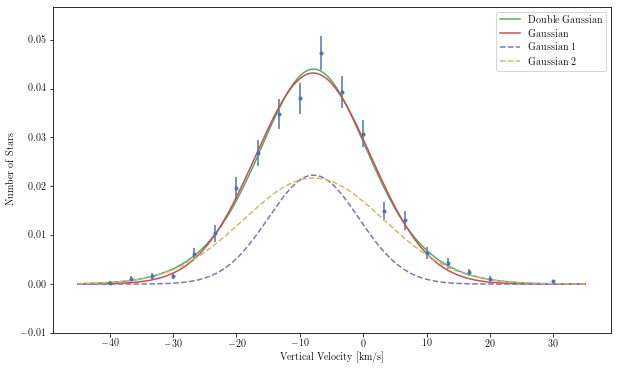

1: mu=-7.89, sigma=9.09, a=0.98
2: mu=-7.83, sigma1=7.13, a1=0.40, sigma2=11.08, a2=0.60
export(hdf5) [########################################] 100.00% elapsed time  :     0.01s =  0.0m =  0.0h
export(hdf5) [########################################] 100.00% elapsed time  :     0.03s =  0.0m =  0.0h
 

In [41]:
wedge = np.linspace(-45, 35, 25)
df, df_fit, name = get_fit(3, wedge)
# df.export(join(data_dir, name), progress=True)
df = vaex.from_pandas(df)
df_fit = vaex.from_pandas(df_fit)

n = name.split("_")
name = f"w_{n[1]}_{n[2]}.hdf5"
df.export(join(data_dir, name), progress=True)
df_fit.export(join(data_dir, "fit_"+name), progress=True)

1676 4


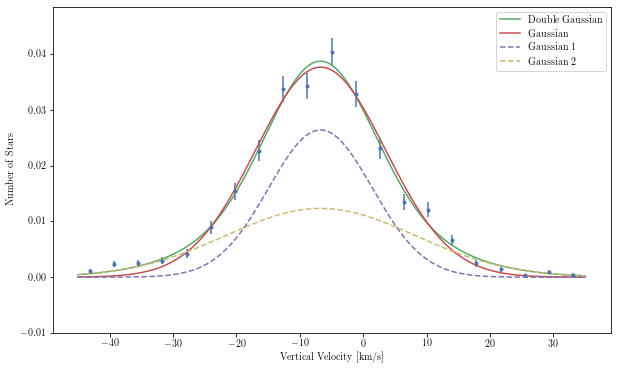

1: mu=-6.72, sigma=10.24, a=0.97
2: mu=-6.74, sigma1=8.17, a1=0.54, sigma2=14.91, a2=0.46
export(hdf5) [########################################] 100.00% elapsed time  :     0.02s =  0.0m =  0.0h
export(hdf5) [########################################] 100.00% elapsed time  :     0.03s =  0.0m =  0.0h
 

'w_(0.23)_(0.26).hdf5.hdf5'

In [42]:
wedge = np.linspace(-45, 35, 22)
df, df_fit, name = get_fit(4, wedge)
# df.export(join(data_dir, name), progress=True)
df = vaex.from_pandas(df)
df_fit = vaex.from_pandas(df_fit)

n = name.split("_")
name = f"w_{n[1]}_{n[2]}.hdf5"
df.export(join(data_dir, name), progress=True)
df_fit.export(join(data_dir, "fit_"+name), progress=True)
name

1446 5


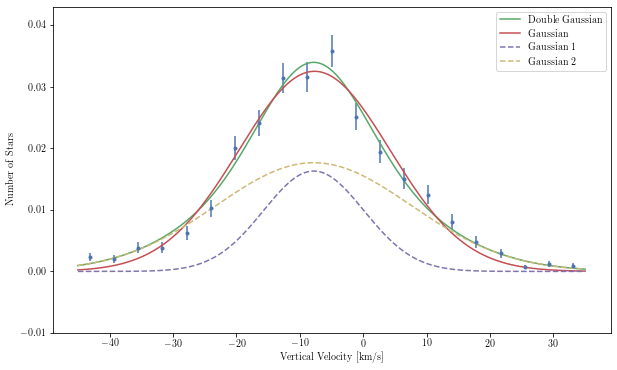

1: mu=-7.68, sigma=11.91, a=0.97
2: mu=-7.81, sigma1=7.91, a1=0.32, sigma2=15.39, a2=0.68
export(hdf5) [########################################] 100.00% elapsed time  :     0.01s =  0.0m =  0.0h
export(hdf5) [########################################] 100.00% elapsed time  :     0.03s =  0.0m =  0.0h
 

'w_(0.26)_(0.28).hdf5.hdf5'

In [43]:
wedge = np.linspace(-45, 35, 22)
df, df_fit, name = get_fit(5, wedge)
# df.export(join(data_dir, name), progress=True)
df = vaex.from_pandas(df)
df_fit = vaex.from_pandas(df_fit)

n = name.split("_")
name = f"w_{n[1]}_{n[2]}.hdf5"
df.export(join(data_dir, name), progress=True)
df_fit.export(join(data_dir, "fit_"+name), progress=True)
name

1816 6


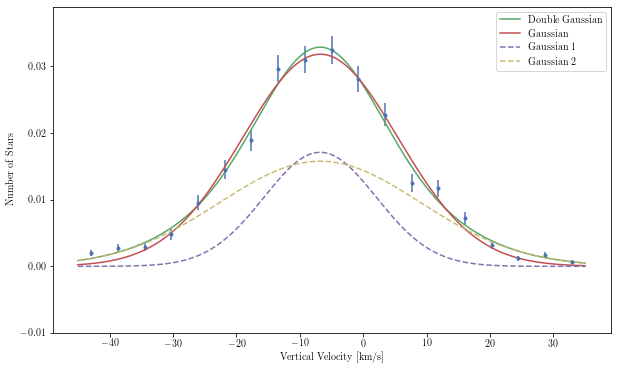

1: mu=-6.76, sigma=12.24, a=0.98
2: mu=-6.80, sigma1=8.85, a1=0.38, sigma2=15.85, a2=0.63
export(hdf5) [########################################] 100.00% elapsed time  :     0.01s =  0.0m =  0.0h
export(hdf5) [########################################] 100.00% elapsed time  :     0.03s =  0.0m =  0.0h
 

'w_(0.28)_(0.30).hdf5.hdf5'

In [44]:
wedge = np.linspace(-45, 35, 20)
df, df_fit, name = get_fit(6, wedge)
# df.export(join(data_dir, name), progress=True)
df = vaex.from_pandas(df)
df_fit = vaex.from_pandas(df_fit)

n = name.split("_")
name = f"w_{n[1]}_{n[2]}.hdf5"
df.export(join(data_dir, name), progress=True)
df_fit.export(join(data_dir, "fit_"+name), progress=True)
name

1956 7


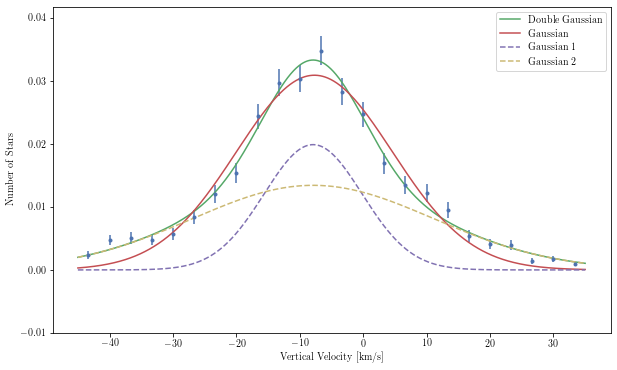

1: mu=-7.70, sigma=12.30, a=0.95
2: mu=-7.90, sigma1=7.73, a1=0.39, sigma2=19.01, a2=0.64
export(hdf5) [########################################] 100.00% elapsed time  :     0.01s =  0.0m =  0.0h
export(hdf5) [########################################] 100.00% elapsed time  :     0.03s =  0.0m =  0.0h
 

'w_(0.30)_(0.32).hdf5.hdf5'

In [45]:
wedge = np.linspace(-45, 35, 25)
df, df_fit, name = get_fit(7, wedge)
# df.export(join(data_dir, name), progress=True)
df = vaex.from_pandas(df)
df_fit = vaex.from_pandas(df_fit)

n = name.split("_")
name = f"w_{n[1]}_{n[2]}.hdf5"
df.export(join(data_dir, name), progress=True)
df_fit.export(join(data_dir, "fit_"+name), progress=True)
name

2187 8


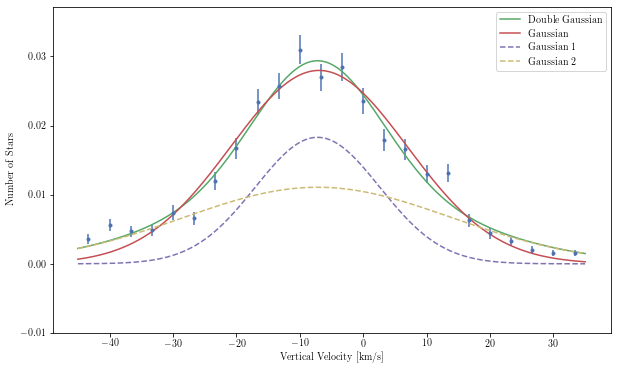

1: mu=-6.97, sigma=13.91, a=0.98
2: mu=-7.21, sigma1=9.81, a1=0.45, sigma2=21.07, a2=0.58
export(hdf5) [########################################] 100.00% elapsed time  :     0.01s =  0.0m =  0.0h
export(hdf5) [########################################] 100.00% elapsed time  :     0.03s =  0.0m =  0.0h
 

'w_(0.32)_(0.34).hdf5.hdf5'

In [46]:
wedge = np.linspace(-45, 35, 25)
df, df_fit, name = get_fit(8, wedge)
# df.export(join(data_dir, name), progress=True)
df = vaex.from_pandas(df)
df_fit = vaex.from_pandas(df_fit)

n = name.split("_")
name = f"w_{n[1]}_{n[2]}.hdf5"
df.export(join(data_dir, name), progress=True)
df_fit.export(join(data_dir, "fit_"+name), progress=True)
name

2449 9


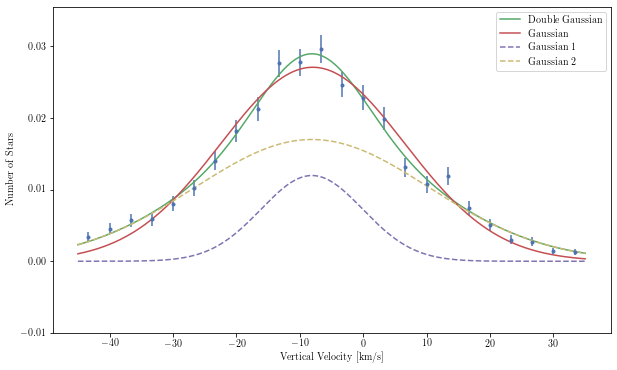

1: mu=-7.95, sigma=14.51, a=0.98
2: mu=-8.09, sigma1=8.03, a1=0.24, sigma2=18.46, a2=0.79
export(hdf5) [########################################] 100.00% elapsed time  :     0.01s =  0.0m =  0.0h
export(hdf5) [########################################] 100.00% elapsed time  :     0.03s =  0.0m =  0.0h
 

'w_(0.34)_(0.36).hdf5.hdf5'

In [47]:
wedge = np.linspace(-45, 35, 25)
df, df_fit, name = get_fit(9, wedge)
# df.export(join(data_dir, name), progress=True)
df = vaex.from_pandas(df)
df_fit = vaex.from_pandas(df_fit)

n = name.split("_")
name = f"w_{n[1]}_{n[2]}.hdf5"
df.export(join(data_dir, name), progress=True)
df_fit.export(join(data_dir, "fit_"+name), progress=True)
name

1294 10


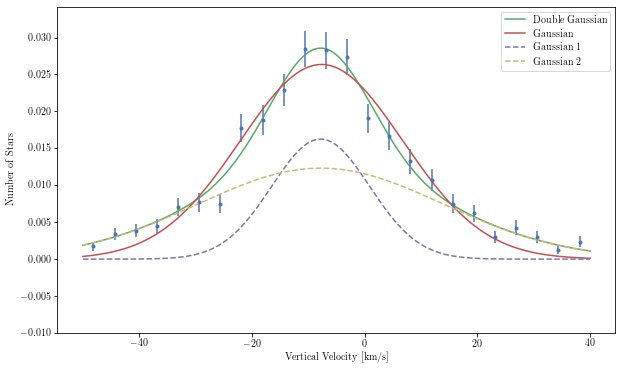

1: mu=-7.66, sigma=14.45, a=0.95
2: mu=-7.81, sigma1=8.69, a1=0.35, sigma2=21.76, a2=0.67
export(hdf5) [########################################] 100.00% elapsed time  :     0.02s =  0.0m =  0.0h
export(hdf5) [########################################] 100.00% elapsed time  :     0.03s =  0.0m =  0.0h
 

'w_(0.36)_(0.37).hdf5.hdf5'

In [48]:
wedge = np.linspace(-50, 40, 25)
df, df_fit, name = get_fit(10, wedge)
# df.export(join(data_dir, name), progress=True)
df = vaex.from_pandas(df)
df_fit = vaex.from_pandas(df_fit)

n = name.split("_")
name = f"w_{n[1]}_{n[2]}.hdf5"
df.export(join(data_dir, name), progress=True)
df_fit.export(join(data_dir, "fit_"+name), progress=True)
name

2437 11


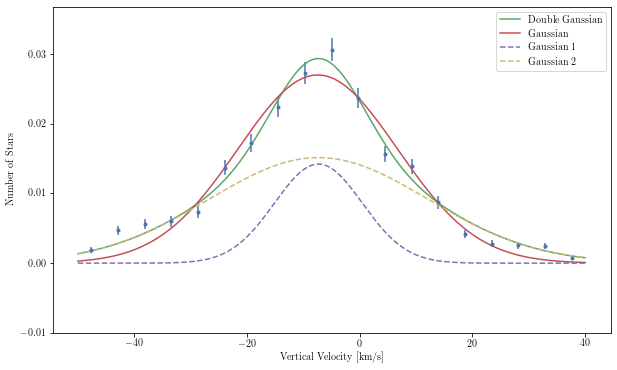

1: mu=-7.45, sigma=14.16, a=0.96
2: mu=-7.32, sigma1=7.79, a1=0.28, sigma2=19.42, a2=0.74
export(hdf5) [########################################] 100.00% elapsed time  :     0.02s =  0.0m =  0.0h
export(hdf5) [########################################] 100.00% elapsed time  :     0.03s =  0.0m =  0.0h
 

'w_(0.37)_(0.39).hdf5.hdf5'

In [49]:
wedge = np.linspace(-50, 40, 20)
df, df_fit, name = get_fit(11, wedge)
# df.export(join(data_dir, name), progress=True)
df = vaex.from_pandas(df)
df_fit = vaex.from_pandas(df_fit)

n = name.split("_")
name = f"w_{n[1]}_{n[2]}.hdf5"
df.export(join(data_dir, name), progress=True)
df_fit.export(join(data_dir, "fit_"+name), progress=True)
name

1103 12


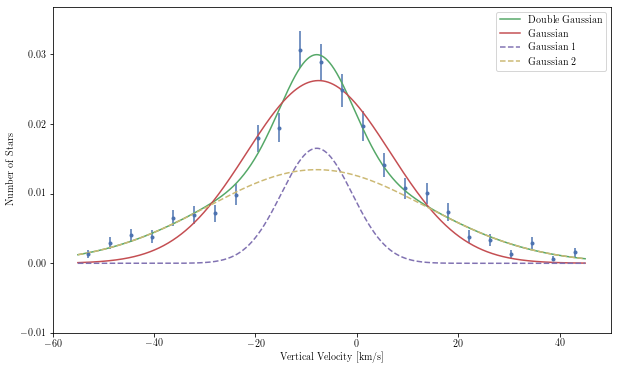

1: mu=-7.55, sigma=14.14, a=0.93
2: mu=-7.92, sigma1=6.98, a1=0.29, sigma2=21.53, a2=0.73
export(hdf5) [########################################] 100.00% elapsed time  :     0.02s =  0.0m =  0.0h
export(hdf5) [########################################] 100.00% elapsed time  :     0.23s =  0.0m =  0.0h 
 

'w_(0.39)_(0.40).hdf5.hdf5'

In [50]:
wedge = np.linspace(-55, 45, 25)
df, df_fit, name = get_fit(12, wedge)
# df.export(join(data_dir, name), progress=True)
df = vaex.from_pandas(df)
df_fit = vaex.from_pandas(df_fit)

n = name.split("_")
name = f"w_{n[1]}_{n[2]}.hdf5"
df.export(join(data_dir, name), progress=True)
df_fit.export(join(data_dir, "fit_"+name), progress=True)
name

In [91]:
fit_files = glob(join(data_dir, "fit_*"))
fit_files.sort()
fit_files

['/home2/s20321005/Thesis-Project/Data/Velocity-Distribution/fit_gaia_(-0.10)_(0.10).hdf5',
 '/home2/s20321005/Thesis-Project/Data/Velocity-Distribution/fit_gaia_(0.10)_(0.16).hdf5',
 '/home2/s20321005/Thesis-Project/Data/Velocity-Distribution/fit_gaia_(0.16)_(0.20).hdf5',
 '/home2/s20321005/Thesis-Project/Data/Velocity-Distribution/fit_gaia_(0.20)_(0.23).hdf5',
 '/home2/s20321005/Thesis-Project/Data/Velocity-Distribution/fit_gaia_(0.23)_(0.26).hdf5',
 '/home2/s20321005/Thesis-Project/Data/Velocity-Distribution/fit_gaia_(0.26)_(0.28).hdf5',
 '/home2/s20321005/Thesis-Project/Data/Velocity-Distribution/fit_gaia_(0.28)_(0.30).hdf5',
 '/home2/s20321005/Thesis-Project/Data/Velocity-Distribution/fit_gaia_(0.30)_(0.32).hdf5',
 '/home2/s20321005/Thesis-Project/Data/Velocity-Distribution/fit_gaia_(0.32)_(0.34).hdf5',
 '/home2/s20321005/Thesis-Project/Data/Velocity-Distribution/fit_gaia_(0.34)_(0.36).hdf5',
 '/home2/s20321005/Thesis-Project/Data/Velocity-Distribution/fit_gaia_(0.36)_(0.37).hdf5'

In [92]:
df = vaex.open_many(fit_files)
df

#,mu,sigma,a,mu_2,sigma1_2,a1_2,sigma2_2,a2_2
0,-6.658897146317167,6.1499377005748315,0.9868152291798222,-6.6862066227352495,5.131361959076712,0.5132063845140845,7.795319746778745,0.4903947627278492
1,-7.00331677915539,6.938758932149491,0.9740570898002118,-6.592732250239681,2.255327822650919,0.12330643573276606,8.09280607303967,0.8772186522060442
2,-6.2286631396226735,7.653295087781057,0.984532335520383,-6.221545492591697,7.425999648431581,0.9412307928516649,100.11909268897783,0.2711723874747925
3,-7.890649023933883,9.169891628875238,0.9920756995509558,-7.8818110329135695,9.005299245376264,0.9633301071301603,37.59939499945716,0.059898084671122113
4,-6.798993988266027,9.803604162572597,0.9744561793765119,-6.751011077994828,6.91989200284663,0.31221244004796334,11.96525540337759,0.6847334939117138
...,...,...,...,...,...,...,...,...
8,-7.290486382753625,12.516995053032021,0.9688160254790265,-7.481013865579511,9.405277497301885,0.5276383933397754,20.33279977121815,0.5021807811049902
9,-8.117619729560497,13.048806583480786,0.9798259949349497,-8.182115890245381,8.93175458797419,0.3416138644939949,16.853392402157137,0.6713337074977334
10,-7.756957329726501,12.470673162358507,0.9508077530650629,-7.820968204176347,9.208063228472614,0.5112796951985306,20.634676560500854,0.5046916873226769
11,-7.349220291587202,12.473455790855663,0.954174108034798,-7.160154189505058,5.312987058946614,0.1581557744933826,15.215138314437487,0.8343484314777653


In [96]:
df = df.to_pandas_df()
df

,mu,sigma,a,mu_2,sigma1_2,a1_2,sigma2_2,a2_2
0,-6.658897,6.149938,0.986815,-6.686207,5.131362,0.513206,7.795320,0.490395
1,-7.003317,6.938759,0.974057,-6.592732,2.255328,0.123306,8.092806,0.877219
2,-6.228663,7.653295,0.984532,-6.221545,7.426000,0.941231,100.119093,0.271172
3,-7.890649,9.169892,0.992076,-7.881811,9.005299,0.963330,37.599395,0.059898
4,-6.798994,9.803604,0.974456,-6.751011,6.919892,0.312212,11.965255,0.684733
5,-7.647824,10.763932,0.971300,-7.652887,5.264142,0.135978,12.321004,0.858204
6,-7.112295,11.428720,0.977470,-7.139303,10.147553,0.744461,19.544803,0.266431
7,-7.508951,11.227437,0.958616,-7.678393,8.233925,0.488791,17.498102,0.525387
8,-7.290486,12.516995,0.968816,-7.481014,9.405277,0.527638,20.332800,0.502181
9,-8.117620,13.048807,0.979826,-8.182116,8.931755,0.341614,16.853392,0.671334


['0.16', '0.20']
['0.39', '0.40']


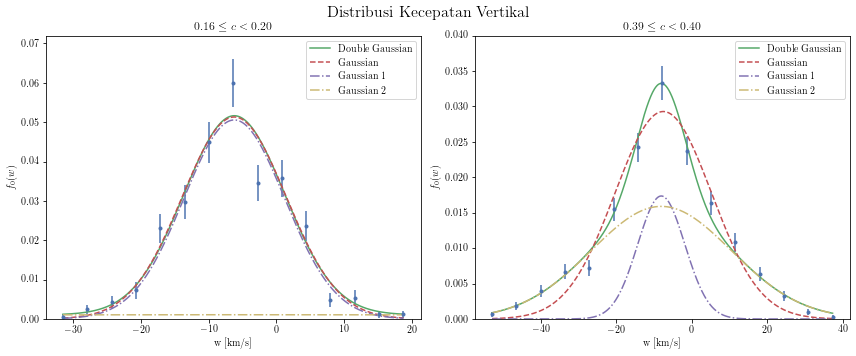

In [99]:
import re

# regex number between ()
regex = re.compile(r'\(([^)]+)\)')

def get_v(index):
    gaia_raw = vaex.open(files[index])
    gaia = gaia_raw.filter("abs(z)<50")
    gaia['f'] = gaia_raw.evaluate("e_w/abs(w)")
    mask = (gaia['f']<0.1) | (gaia['e_w']<1)
    gaia = gaia[mask]
    gaia = gaia.extract()
    ws = gaia['w'].to_numpy()
    wmean = np.mean(ws)
    wstd = np.std(ws)
    wedge = np.linspace(wmean-4*wstd, wmean+4*wstd, 20)
    wmid = (wedge[1:] + wedge[:-1]) / 2
    wnum, _ = np.histogram(ws, wedge)
    mask = wnum > 0
    wmid = wmid[mask]
    wnum = wnum[mask]
    werr = np.sqrt(wnum)

    # print(len(ws), index)
    area = wnum.sum() * (wedge[1] - wedge[0])
    return wmid, wnum/area, werr/area

w12, n12, e12 = get_v(12)

fig, axes = plt.subplots(1, 2, figsize=(12, 5))
for i, ax in zip([2, 12], axes):
    wmid, wnum, werr = get_v(i)
    popt1 = df['mu'][i], df['sigma'][i], df['a'][i]
    popt2 = df['mu_2'][i], df['sigma1_2'][i], df['a1_2'][i], df['sigma2_2'][i], df['a2_2'][i]
    ws = np.linspace(np.min(wmid), np.max(wmid), 1000)
    fw1 = gaussian(ws, *popt1)
    fw2 = double_gaussian(ws, *popt2)
    name = files[i].split('/')[-1]
    c = re.findall(regex, name)
    print(c)

    ax.errorbar(wmid, wnum, yerr=werr, fmt='.')
    ax.plot(ws, fw2, label="Double Gaussian")
    ax.plot(ws, fw1, label="Gaussian", ls="--")
    ax.plot(ws, gaussian(ws, popt2[0], popt2[1], popt2[2]), label="Gaussian 1", ls="-.")
    ax.plot(ws, gaussian(ws, popt2[0], popt2[3], popt2[4]), label="Gaussian 2", ls="-.")
    ax.set_xlabel("w [km/s]")
    ax.set_ylabel(r"$f_0(w)$")
    ax.legend()
    ax.set_title(r"${}\leq c<{}$".format(c[0], c[1]))
    ax.set_ylim(0, np.max(wnum)*1.2)
fig.suptitle("Distribusi Kecepatan Vertikal", fontsize=16)
fig.tight_layout()
fig.subplots_adjust(top=0.9)
fig.savefig(join("img", "w-dist.pdf"), dpi=300)
plt.show()

